# The Data Manipulation Is Reused From Assignment 1

The classification sections for Assignment 2 start below.  You can scroll down until you find the Assignment 2 header.

# IMPORT SECTION
<li> designate file location of data
<li> import libraries
<li> set options
<li> load data

## Designate File Location of Data to Import

#### NOTE:  attempted to save csv file as UTF 8 but still generated: 
        "UnicodeDecodeError: 'utf-8' codec can't decode byte 0xb0 in position 40: invalid start byte"
####    adjusted csv header to delete the degree symbol in the two temperature columns.  Replaced symbol with a "d".

In [1]:
#    import necessary libraries 
import numpy as np
import pandas as pd
import datetime
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from datetime import datetime

import warnings
warnings.filterwarnings("ignore")

#    option modifications
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 50)
pd.set_option('display.width', 1000)
pd.set_option('display.colheader_justify', 'center')
pd.set_option('display.precision', 3)

ShowWork = True  #Set to true if you want to see work, False if work should be hidden

#    import data
pdBikeData = pd.read_csv("SeoulBikeData.csv")
##    attempted to save csv file as UTF 8 but still generated: "UnicodeDecodeError: 'utf-8' codec can't decode byte 0xb0 in position 40: invalid start byte"
##    adjusted csv header to delete the degree symbol in the two temperature columns.  Replaced symbol with a "d".

# DEFINE GLOBAL CONTROL FUNCTIONS
<li> printif - print statement used to show work
<li> displayif - display statement used to show work

In [2]:
def printif(ShowWork = True, StringToPrint=""):
    if ShowWork: print(StringToPrint)
        
def displayif(ShowWork = True, dataframe = []):
    if ShowWork: display(dataframe)

## Manipulate Data As Needed (Global)
<li>Verify no nulls
<li>Verify data structure integrity - Fix if needed
<li>Transform Categorical Data 

In [3]:
#    Check for null values
printif(ShowWork, "Total Amount of Null Values in Data:" + str(pdBikeData.isnull().sum().sum()))
#    Inspect data
printif(ShowWork, "Original Header Output:" )
displayif(ShowWork, pdBikeData.head())

##   1st column header was not included.  Add "Date" as first column header and remove "Unnamed: 13"
pdBikeData.columns = ["Date"] + pdBikeData.columns[0:-1].tolist()

#    Verify formating now correct
printif(ShowWork, '\n\nAfter adjusting the Header to include Date:')
displayif(ShowWork, pdBikeData.head())

printif(ShowWork, "\n\nNow we need to transform all of the Categorical Data to include in Regression...")
#    Convert four Seasons Categorical Data to 3 individual columns
printif(ShowWork, "The Seasons categories are:" )
printif(ShowWork, pdBikeData['Seasons'].unique())
printif(ShowWork, "Creating Spring, Summer, and Autumn columns")
#    Add 3 Columns (exclude 4th column as it is redundant when you know the other 3)
pdBikeData.insert(12, 'Winter', (pdBikeData[["Seasons"]] == "Winter") * 1, allow_duplicates=False)
pdBikeData.insert(12, 'Autumn', (pdBikeData[["Seasons"]] == "Autumn") * 1, allow_duplicates=False)
pdBikeData.insert(12, 'Summer', (pdBikeData[["Seasons"]] == "Summer") * 1, allow_duplicates=False)
pdBikeData.insert(12, 'Spring', (pdBikeData[["Seasons"]] == "Spring") * 1, allow_duplicates=False)

#    Delete Original Seasons Column
del pdBikeData['Seasons']
#    Add Column for intercept X0=1 value
pdBikeData.insert(2, "X0", 1, allow_duplicates=False)

#    Convert Holiday column to 1/0 representation
printif(ShowWork, "\nThe Holiday categories are:" )
printif(ShowWork, pdBikeData['Holiday'].unique())
printif(ShowWork, "Converting to 1/0 (Holiday/No Holiday)")
pdBikeData['Holiday'] = (pdBikeData['Holiday']=='Holiday') * 1

#    Convert Functioning Day column to 1/0 representation
printif(ShowWork, "\nThe Functioning Day categories are:" )
printif(ShowWork, pdBikeData['Functioning Day'].unique())
printif(ShowWork, "Converting to 1/0 (Yes/No)")
pdBikeData['Functioning Day']=(pdBikeData['Functioning Day']=='Yes') * 1



print("\n\nOur updated dataframe ready for regression:")
display(pdBikeData)

Total Amount of Null Values in Data:0
Original Header Output:


,Rented Bike Count,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Unnamed: 13
0,1/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,1/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,1/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,1/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,1/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes




After adjusting the Header to include Date:


,Date,Rented Bike Count,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,1/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,1/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,1/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,1/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,1/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes




Now we need to transform all of the Categorical Data to include in Regression...
The Seasons categories are:
['Winter' 'Spring' 'Summer' 'Autumn']
Creating Spring, Summer, and Autumn columns

The Holiday categories are:
['No Holiday' 'Holiday']
Converting to 1/0 (Holiday/No Holiday)

The Functioning Day categories are:
['Yes' 'No']
Converting to 1/0 (Yes/No)


Our updated dataframe ready for regression:


,Date,Rented Bike Count,X0,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Spring,Summer,Autumn,Winter,Holiday,Functioning Day
0,1/12/2017,254,1,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
1,1/12/2017,204,1,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
2,1/12/2017,173,1,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,0,0,1,0,1
3,1/12/2017,107,1,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
4,1/12/2017,78,1,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,1,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,0,0,1,0,0,1
8756,30/11/2018,764,1,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,0,0,1,0,0,1
8757,30/11/2018,694,1,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,0,0,1,0,0,1
8758,30/11/2018,712,1,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,0,0,1,0,0,1


In [4]:
#     Create DayofWeek indicator 
DayofWeek = pd.to_datetime(pdBikeData["Date"], errors='ignore', format = '%mm%dd%YYYY')
Day = pd.to_datetime(DayofWeek, errors='ignore')
X=pdBikeData["X0"].copy()
for i in range (0, len(pdBikeData)):
    X[i] = Day[i].weekday()

pdBikeData.insert(2, 'DayOfWeek', X, allow_duplicates=False)
pdBikeData

,Date,Rented Bike Count,DayOfWeek,X0,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Spring,Summer,Autumn,Winter,Holiday,Functioning Day
0,1/12/2017,254,3,1,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
1,1/12/2017,204,3,1,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
2,1/12/2017,173,3,1,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,0,0,1,0,1
3,1/12/2017,107,3,1,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
4,1/12/2017,78,3,1,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,4,1,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,0,0,1,0,0,1
8756,30/11/2018,764,4,1,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,0,0,1,0,0,1
8757,30/11/2018,694,4,1,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,0,0,1,0,0,1
8758,30/11/2018,712,4,1,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,0,0,1,0,0,1


### Create Train Test Split After Initial Global Manipulating Is Done

In [5]:
X_train, X_test, y_train, y_test = train_test_split(pdBikeData, pdBikeData['Rented Bike Count'], test_size = 0.3 , random_state=42)

display(X_train)

,Date,Rented Bike Count,DayOfWeek,X0,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Spring,Summer,Autumn,Winter,Holiday,Functioning Day
1444,30/01/2018,33,1,1,4,-11.1,50,1.2,1986,-19.4,0.00,0.0,0.0,0,0,0,1,0,1
1652,7/2/2018,218,0,1,20,-5.8,44,2.1,1994,-16.1,0.00,0.0,0.0,0,0,0,1,0,1
7496,9/10/2018,0,0,1,8,11.4,66,0.8,1991,5.2,0.18,0.0,0.0,0,0,1,0,1,0
1893,17/02/2018,133,5,1,21,-2.3,38,2.3,2000,-14.7,0.00,0.0,0.0,0,0,0,1,1,1
3880,11/5/2018,1496,0,1,16,19.1,54,3.2,542,9.5,0.94,0.0,0.0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,27/07/2018,1507,4,1,22,29.9,74,2.0,1201,24.7,0.00,0.0,0.0,0,1,0,0,0,1
5191,5/7/2018,828,0,1,7,23.5,90,0.5,445,21.7,0.05,0.5,0.0,0,1,0,0,0,1
5390,13/07/2018,999,4,1,14,29.5,62,2.7,1941,21.4,1.79,0.0,0.0,0,1,0,0,0,1
860,5/1/2018,322,1,1,20,-3.4,51,1.1,1391,-12.1,0.00,0.0,0.0,0,0,0,1,0,1


### Add a Day of the Week Mean Evaluator 

In [6]:
#    create Day of Week dictionary
data = {'DayOfWeek': [0,1,2,3,4,5,6],
        'Mean': [X_train[(X_train["DayOfWeek"]==0)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==1)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==2)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==3)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==4)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==5)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==6)]["Rented Bike Count"].mean()
                ]
       }

#    Create Day of Week DataFrame 
DOWData = pd.DataFrame(data)
#    insert an adjustment factor
DOWData.insert (2, "MeanAdj", DOWData["Mean"]-DOWData["Mean"].mean(), allow_duplicates = False)

printif(ShowWork,DOWData)

#    Create DOWAdjust in pdBikeData
pdBikeData.insert(4, 'DOWAdjust', 0, allow_duplicates=False)
for i in range(0,len(pdBikeData)):
    pdBikeData.iloc[i,4] = DOWData.iloc[pdBikeData.iloc[i,2],2]

display(pdBikeData)


   DayOfWeek   Mean    MeanAdj
0      0      714.043   6.466 
1      1      666.872 -40.705 
2      2      710.771   3.194 
3      3      741.941  34.364 
4      4      762.989  55.413 
5      5      738.361  30.784 
6      6      618.060 -89.517 


,Date,Rented Bike Count,DayOfWeek,X0,DOWAdjust,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Spring,Summer,Autumn,Winter,Holiday,Functioning Day
0,1/12/2017,254,3,1,34.364,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
1,1/12/2017,204,3,1,34.364,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
2,1/12/2017,173,3,1,34.364,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,0,0,1,0,1
3,1/12/2017,107,3,1,34.364,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
4,1/12/2017,78,3,1,34.364,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,4,1,55.413,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,0,0,1,0,0,1
8756,30/11/2018,764,4,1,55.413,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,0,0,1,0,0,1
8757,30/11/2018,694,4,1,55.413,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,0,0,1,0,0,1
8758,30/11/2018,712,4,1,55.413,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,0,0,1,0,0,1


### Convert Hour to RankedHour 
   <li>Convert Hour to RankedHour based on Average for the hour

[6, 5, 4, 2, 0, 1, 3, 8, 17, 10, 7, 9, 12, 13, 14, 15, 18, 21, 23, 22, 20, 19, 16, 11]
0        6
1        5
2        4
3        2
4        0
        ..
8755    22
8756    20
8757    19
8758    16
8759    11
Name: Hour, Length: 8760, dtype: int64


,HourRentalAvg,rankoutput
0,541.317,6
1,445.880,5
2,301.622,4
3,196.698,2
4,129.837,0
5,139.743,1
6,280.523,3
7,567.953,8
8,944.127,17
9,660.713,10


Takeaway here is mostly linear relationship except for peak hour. 
Create Two Hour Columns: one for rank, one for peak. 
This may vary depending on the random state.


<AxesSubplot:xlabel='rankoutput', ylabel='HourRentalAvg'>

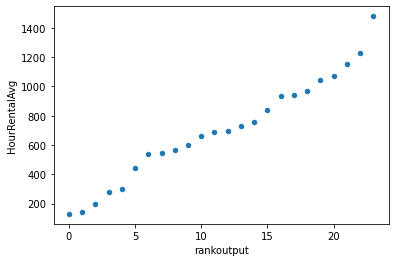

In [7]:
#    Get the mean for each hour in the training set
HourRentalAvg = [0]*24
for i in range (0,24):
    HourRentalAvg[i] = X_train[(X_train["Hour"]==i)]["Rented Bike Count"].mean()

#    Rank the mean of each hour in the training set
rankoutput = [0] * len(HourRentalAvg)
for i, x in enumerate(sorted(range(len(HourRentalAvg)), key=lambda y: HourRentalAvg[y])):
    rankoutput[x] = i
printif(ShowWork, rankoutput)

#    Create list containing matching Ranks for every hour
AvgHourRank = pdBikeData["Hour"].copy()
for i in range (0,len(pdBikeData)):
    AvgHourRank[i] = rankoutput[pdBikeData.iloc[i,5]]
printif(ShowWork, AvgHourRank) 

#    Combine hour rental avg and rank into a dataframe
zipped = list(zip(HourRentalAvg, rankoutput))
AVGHOUR= pd.DataFrame(zipped, columns = ['HourRentalAvg', 'rankoutput'])
displayif (ShowWork,AVGHOUR)

print("Takeaway here is mostly linear relationship except for peak hour. \nCreate Two Hour Columns: one for rank, one for peak. \nThis may vary depending on the random state.")
displayif(ShowWork, AVGHOUR.plot(x=1, y= 0, kind='scatter'))

#    Insert Hour Rankings and Peak Hour Indication 
pdBikeData.insert(6, 'HourRank', AvgHourRank, allow_duplicates=False)
pdBikeData.insert(7, 'PeakHours', (pdBikeData[["HourRank"]] > 22) *1 , allow_duplicates=False)

In [8]:
display (pdBikeData.head(24))

,Date,Rented Bike Count,DayOfWeek,X0,DOWAdjust,Hour,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Spring,Summer,Autumn,Winter,Holiday,Functioning Day
0,1/12/2017,254,3,1,34.364,0,6,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,0,0,0,1,0,1
1,1/12/2017,204,3,1,34.364,1,5,0,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,0,0,0,1,0,1
2,1/12/2017,173,3,1,34.364,2,4,0,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,0,0,0,1,0,1
3,1/12/2017,107,3,1,34.364,3,2,0,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,0,0,0,1,0,1
4,1/12/2017,78,3,1,34.364,4,0,0,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,0,0,0,1,0,1
5,1/12/2017,100,3,1,34.364,5,1,0,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,0,0,0,1,0,1
6,1/12/2017,181,3,1,34.364,6,3,0,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,0,0,0,1,0,1
7,1/12/2017,460,3,1,34.364,7,8,0,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,0,0,0,1,0,1
8,1/12/2017,930,3,1,34.364,8,17,0,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,0,0,0,1,0,1
9,1/12/2017,490,3,1,34.364,9,10,0,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,0,0,0,1,0,1


### Check to see if there is linearity in Seasons for further consolidation
   <li>Possibly consolidate seasons
   <li>Check to see if spring summer autumn winter are different?

In [9]:
#    Get the hourly means for each season in the training set
SpringMean = X_train[X_train["Spring"] ==1]["Rented Bike Count"].mean()
SummerMean = X_train[X_train["Summer"] ==1]["Rented Bike Count"].mean()
AutumnMean = X_train[X_train["Autumn"] ==1]["Rented Bike Count"].mean()
WinterMean = X_train[X_train["Winter"] ==1]["Rented Bike Count"].mean()

printif(ShowWork,"SpringMean:" + str(SpringMean) +"\n SummerMean:" + str(SummerMean) +"\n AutumnMean:" + str(AutumnMean) + "\n WinterMean:" + str(WinterMean))

pdBikeData.insert(20, "SeasonalMeanAdj", (pdBikeData["Spring"]*SpringMean + pdBikeData["Summer"]*SummerMean + pdBikeData["Autumn"]*AutumnMean + pdBikeData["Winter"]*WinterMean)/SummerMean)

pdBikeData

SpringMean:721.3258785942492
 SummerMean:1035.8969539857421
 AutumnMean:826.1104613385315
 WinterMean:225.2107744107744


,Date,Rented Bike Count,DayOfWeek,X0,DOWAdjust,Hour,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Spring,Summer,Autumn,Winter,SeasonalMeanAdj,Holiday,Functioning Day
0,1/12/2017,254,3,1,34.364,0,6,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0.217,0,1
1,1/12/2017,204,3,1,34.364,1,5,0,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0.217,0,1
2,1/12/2017,173,3,1,34.364,2,4,0,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,0,0,1,0.217,0,1
3,1/12/2017,107,3,1,34.364,3,2,0,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0.217,0,1
4,1/12/2017,78,3,1,34.364,4,0,0,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,0,0,1,0.217,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,4,1,55.413,19,22,0,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,0,0,1,0,0.797,0,1
8756,30/11/2018,764,4,1,55.413,20,20,0,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,0,0,1,0,0.797,0,1
8757,30/11/2018,694,4,1,55.413,21,19,0,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,0,0,1,0,0.797,0,1
8758,30/11/2018,712,4,1,55.413,22,16,0,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,0,0,1,0,0.797,0,1


### Drop original variables that have been transformed into other variables

In [10]:
#    Create a copy of the data before dropping it in case we want to recall it later
BeforeDrop=pdBikeData.copy()
BeforeDrop

,Date,Rented Bike Count,DayOfWeek,X0,DOWAdjust,Hour,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Spring,Summer,Autumn,Winter,SeasonalMeanAdj,Holiday,Functioning Day
0,1/12/2017,254,3,1,34.364,0,6,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0.217,0,1
1,1/12/2017,204,3,1,34.364,1,5,0,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0.217,0,1
2,1/12/2017,173,3,1,34.364,2,4,0,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,0,0,1,0.217,0,1
3,1/12/2017,107,3,1,34.364,3,2,0,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0.217,0,1
4,1/12/2017,78,3,1,34.364,4,0,0,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,0,0,1,0.217,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,4,1,55.413,19,22,0,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,0,0,1,0,0.797,0,1
8756,30/11/2018,764,4,1,55.413,20,20,0,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,0,0,1,0,0.797,0,1
8757,30/11/2018,694,4,1,55.413,21,19,0,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,0,0,1,0,0.797,0,1
8758,30/11/2018,712,4,1,55.413,22,16,0,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,0,0,1,0,0.797,0,1


In [11]:
del pdBikeData['Date']
del pdBikeData['DayOfWeek']
del pdBikeData['Hour']
del pdBikeData['Spring']
del pdBikeData['Summer']
del pdBikeData['Autumn']
del pdBikeData['Winter']
pdBikeData

,Rented Bike Count,X0,DOWAdjust,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),SeasonalMeanAdj,Holiday,Functioning Day
0,254,1,34.364,6,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0.217,0,1
1,204,1,34.364,5,0,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0.217,0,1
2,173,1,34.364,4,0,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0.217,0,1
3,107,1,34.364,2,0,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0.217,0,1
4,78,1,34.364,0,0,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0.217,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1003,1,55.413,22,0,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,0.797,0,1
8756,764,1,55.413,20,0,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,0.797,0,1
8757,694,1,55.413,19,0,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,0.797,0,1
8758,712,1,55.413,16,0,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,0.797,0,1


## Visualize The Relationships Between Rentals and NonConverted Variables

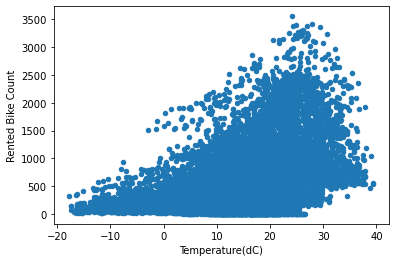

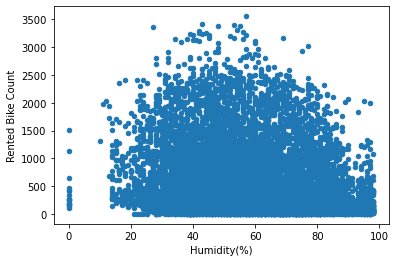

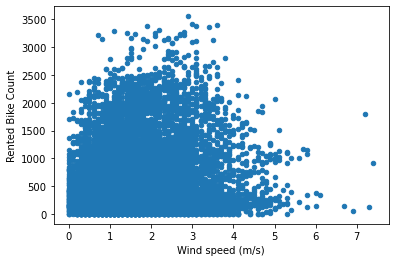

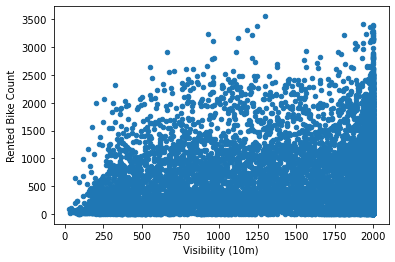

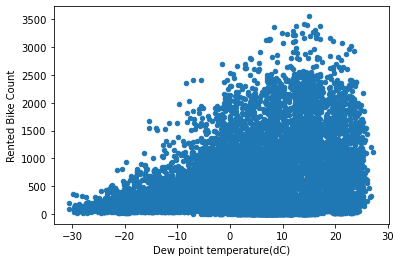

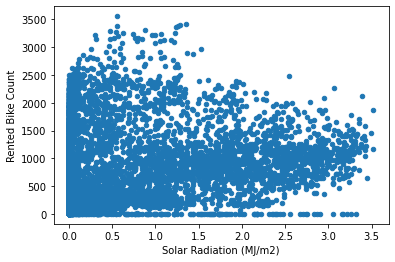

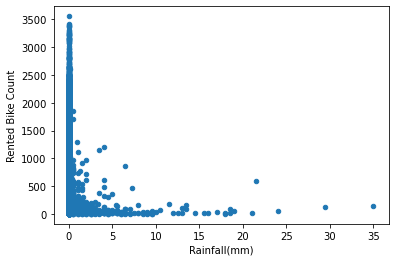

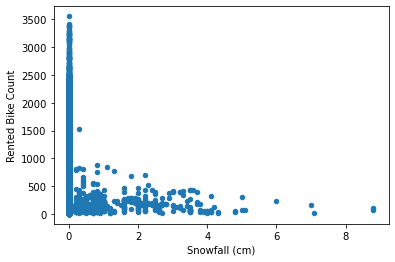

In [12]:
#    Show scatter plots for non binary columns
for i in range(5,13):
    pdBikeData.plot(x=i, y= "Rented Bike Count", kind='scatter')

## Final Scaling For Regression Model

In [13]:
#    Reset the train set with all updated variables
X_train, X_test, y_train, y_test = train_test_split(pdBikeData, pdBikeData['Rented Bike Count'], test_size = 0.3, random_state=42)

#    Scale all columns that need 
for i in ("DOWAdjust","HourRank","Temperature(dC)","Humidity(%)","Wind speed (m/s)","Visibility (10m)","Dew point temperature(dC)","Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"):
    pdBikeData[i] = (pdBikeData[i] - X_train[i].mean())/(X_train[i].max()-X_train[i].mean())
display(pdBikeData)


,Rented Bike Count,X0,DOWAdjust,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),SeasonalMeanAdj,Holiday,Functioning Day
0,254,1,0.626,-0.481,0,-0.701,-0.533,0.082,1.000,-0.946,-0.198,-0.006,-0.009,0.217,0,1
1,204,1,0.626,-0.568,0,-0.712,-0.508,-0.165,1.000,-0.946,-0.198,-0.006,-0.009,0.217,0,1
2,173,1,0.626,-0.655,0,-0.731,-0.483,-0.129,1.000,-0.950,-0.198,-0.006,-0.009,0.217,0,1
3,107,1,0.626,-0.829,0,-0.739,-0.458,-0.147,1.000,-0.946,-0.198,-0.006,-0.009,0.217,0,1
4,78,1,0.626,-1.003,0,-0.731,-0.558,0.100,1.000,-0.989,-0.198,-0.006,-0.009,0.217,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1003,1,1.000,0.913,0,-0.339,-0.609,0.153,0.811,-0.629,-0.198,-0.006,-0.009,0.797,0,1
8756,764,1,1.000,0.739,0,-0.370,-0.533,0.100,1.000,-0.611,-0.198,-0.006,-0.009,0.797,0,1
8757,694,1,1.000,0.652,0,-0.400,-0.483,-0.253,0.943,-0.611,-0.198,-0.006,-0.009,0.797,0,1
8758,712,1,1.000,0.390,0,-0.420,-0.433,-0.129,0.749,-0.607,-0.198,-0.006,-0.009,0.797,0,1


### Correlation Matrix

In [14]:
CorData = pdBikeData.copy()
CorData.drop(columns = "X0", axis = 1, inplace = True)
corr = CorData.corr().round(3)
corr.style.background_gradient(cmap='coolwarm')

mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
corr[mask] = np.nan
(corr
 .style
 .background_gradient(cmap='coolwarm', axis=None, vmin=-1, vmax=1)
 .highlight_null(null_color='#f1f1f1')  # Color NaNs grey
 .set_precision(2))

,Rented Bike Count,DOWAdjust,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),SeasonalMeanAdj,Holiday,Functioning Day
Rented Bike Count,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
DOWAdjust,0.06,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
HourRank,0.53,0.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
PeakHours,0.26,-0.00,0.35,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Temperature(dC),0.54,0.02,0.14,0.04,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Humidity(%),-0.20,0.02,-0.28,-0.07,0.16,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Wind speed (m/s),0.12,0.02,0.34,0.10,-0.04,-0.34,nan,nan,nan,nan,nan,nan,nan,nan,nan
Visibility (10m),0.20,-0.00,0.11,0.04,0.04,-0.54,0.17,nan,nan,nan,nan,nan,nan,nan,nan
Dew point temperature(dC),0.38,0.02,-0.00,0.00,0.91,0.54,-0.18,-0.18,nan,nan,nan,nan,nan,nan,nan
Solar Radiation (MJ/m2),0.26,0.01,0.18,-0.04,0.35,-0.46,0.33,0.15,0.09,nan,nan,nan,nan,nan,nan


## Update Train Test Split After All Manipulating Is Done

In [15]:
X_train, X_test, y_train, y_test = train_test_split(pdBikeData, pdBikeData['Rented Bike Count'], test_size = 0.3, random_state=42)

display(X_train)


,Rented Bike Count,X0,DOWAdjust,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),SeasonalMeanAdj,Holiday,Functioning Day
1444,33,1,-0.706,-1.003,0,-0.928,-0.206,-0.094,0.975,-1.024,-0.198,-0.006,-0.009,0.217,0,1
1652,218,1,0.131,0.739,0,-0.724,-0.357,0.065,0.989,-0.881,-0.198,-0.006,-0.009,0.217,0,1
7496,0,1,0.131,0.477,0,-0.062,0.196,-0.165,0.984,0.044,-0.137,-0.006,-0.009,0.797,1,0
1893,133,1,0.563,0.652,0,-0.589,-0.508,0.100,1.000,-0.820,-0.198,-0.006,-0.009,0.217,1,1
3880,1496,1,0.131,0.565,0,0.234,-0.106,0.259,-1.595,0.231,0.122,-0.006,-0.009,0.696,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,1507,1,1.000,0.390,0,0.650,0.397,0.047,-0.422,0.891,-0.198,-0.006,-0.009,1.000,0,1
5191,828,1,0.131,-0.306,0,0.404,0.799,-0.218,-1.768,0.761,-0.181,0.015,-0.009,1.000,0,1
5390,999,1,1.000,0.216,0,0.635,0.095,0.171,0.895,0.748,0.411,-0.006,-0.009,1.000,0,1
860,322,1,-0.706,0.739,0,-0.631,-0.181,-0.112,-0.084,-0.707,-0.198,-0.006,-0.009,0.217,0,1


### Show the Mean and Mode for potential target classification values for Assignments 2,3,4

In [16]:
print("Mean: ", y_train.mean())
print("Median: ", y_train.median())

Mean:  706.6350293542074
Median:  507.5


# -----------------------------------------------------------------------------------------------
# BEGINNING OF ASSIGNMENT 2

In [17]:
#    Linear SVC 
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn import svm

#    GridSearchCV capabilities
from sklearn.model_selection import GridSearchCV

#    Sklearn ROC curve and Confusion Matrix capabilities
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, auc

#    Heatmap capabilities
import seaborn as sns

### Introduce Target Variable

#### The meadian value of the training set was choosen to establish a target variable for our classification models

In [18]:
print("The training set median value of Rented Bikes: ", X_train['Rented Bike Count'].median())
pdBikeData.insert(1, 'MedianOrHigher', (pdBikeData[['Rented Bike Count']] >= X_train['Rented Bike Count'].median()) * 1, allow_duplicates=False)

#    Resplit the data know that the target variable has been added.
X_train, X_test, y_train, y_test = train_test_split(pdBikeData.iloc[:,3:], pdBikeData['MedianOrHigher'], test_size = 0.3, random_state=42)
print("After updating with the target variable and resplitting, this is what our Test data looks like:")
display(X_train)


The training set median value of Rented Bikes:  507.5
After updating with the target variable and resplitting, this is what our Test data looks like:


,DOWAdjust,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),SeasonalMeanAdj,Holiday,Functioning Day
1444,-0.706,-1.003,0,-0.928,-0.206,-0.094,0.975,-1.024,-0.198,-0.006,-0.009,0.217,0,1
1652,0.131,0.739,0,-0.724,-0.357,0.065,0.989,-0.881,-0.198,-0.006,-0.009,0.217,0,1
7496,0.131,0.477,0,-0.062,0.196,-0.165,0.984,0.044,-0.137,-0.006,-0.009,0.797,1,0
1893,0.563,0.652,0,-0.589,-0.508,0.100,1.000,-0.820,-0.198,-0.006,-0.009,0.217,1,1
3880,0.131,0.565,0,0.234,-0.106,0.259,-1.595,0.231,0.122,-0.006,-0.009,0.696,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,1.000,0.390,0,0.650,0.397,0.047,-0.422,0.891,-0.198,-0.006,-0.009,1.000,0,1
5191,0.131,-0.306,0,0.404,0.799,-0.218,-1.768,0.761,-0.181,0.015,-0.009,1.000,0,1
5390,1.000,0.216,0,0.635,0.095,0.171,0.895,0.748,0.411,-0.006,-0.009,1.000,0,1
860,-0.706,0.739,0,-0.631,-0.181,-0.112,-0.084,-0.707,-0.198,-0.006,-0.009,0.217,0,1


### Define Custom Made Functions 

In [19]:
#    TransofrmRBF takes the GridSearchCV fit dataframe and converts the data to 10^ format and adds a time cost variable
def TransformRBF(data=[], CrossVal = 0):
    subset = data.loc[:,['param_C','param_gamma','mean_fit_time', 'mean_score_time','mean_test_score']]
    
    subset['param_C'] = pd.to_numeric(subset['param_C'], errors='coerce')
    subset['param_gamma'] = pd.to_numeric(subset['param_gamma'], errors='coerce')
    #display(subset.head())
    
    subset['Total_Time'] = CrossVal * (subset['mean_fit_time'] + subset['mean_score_time']) 
    subset['Time_Per_Accuracy_Percentage']= subset['mean_fit_time']/(100*subset['mean_test_score'])
    #display(subset.head())
    
    transformedsubset = subset.copy()
    transformedsubset['param_C'] = np.log10(subset.loc[:,'param_C']) 
    transformedsubset['param_gamma'] = np.log10(transformedsubset['param_gamma'])
    
    return transformedsubset

#    CostFigure3D allows us to display a dataframe in 3Dimension.  Used for RBF visualization
def CostFigure3D(data=[], Axis=['X','Y','Z'], Title="" , Elev = 0, Azim = 0):
    #    Transform data for 3D plotting
    Z = data.pivot_table(index=data.columns[0], columns=data.columns[1], values=data.columns[2]).T.values
    X_unique = np.sort(data[data.columns[0]].unique())
    Y_unique = np.sort(data[data.columns[1]].unique())
    X, Y = np.meshgrid(X_unique, Y_unique)
    
    #    Establish plot parameter setting
    fig = plt.figure()
    fig.set_figheight(13)
    fig.set_figwidth(12)
    ax = fig.add_subplot(projection='3d')
    ax.set_xlabel(Axis[0])
    ax.set_ylabel(Axis[1])
    ax.set_zlabel(Axis[2])
    plt.title(Title)

     # Angle values imported as parameters through function
    elev = Elev
    azim =Azim
    ax.view_init(elev, azim)

    # Plot a basic wireframe.
    ax.plot_wireframe(X, Y, Z, rstride=90, cstride=90)

    ax.plot_surface(X, Y, Z, cmap="winter", lw=0.5, rstride=1, cstride=1, alpha = 0.25)
    ax.contour3D(X, Y, Z, cmap="binary")
    plt.show()
    
#    Displays the confusion matrix and ROC Curve
def ShowCMandROC (ToPlot=[], Title="NoTitleGiven"):
    #Train Outcomes
    disp = plot_confusion_matrix(ToPlot,  X_train, y_train, cmap='Blues', values_format='d')
    disp.ax_.set_title(Title +" Training Set")
    disp = plot_roc_curve(ToPlot, X_train, y_train)
    disp.ax_.set_title(Title +" Training Set")

    #Test Outcomes
    disp = plot_confusion_matrix(ToPlot,  X_test, y_test, cmap='Blues', values_format='d')
    disp.ax_.set_title(Title +" Testing Set")
    disp = plot_roc_curve(ToPlot, X_test, y_test)
    disp.ax_.set_title(Title +" Testing Set")
    
#    Display the Test Data Results
def ShowTestResults(ToTest=[], Title="NoTitleGiven",AUC_On=False):
    y_pred = ToTest.predict(X_test)
    
    if AUC_On :
        yPred_p = ToTest.predict_proba(X_test)[:,1]

    cm = confusion_matrix(y_test, y_pred)
    tn,fp,fn,tp = confusion_matrix(y_test, y_pred).ravel()

    print("TEST DATA RESULTS : ", Title,"\n***************************************")
    print("         Accuracy : ", accuracy_score(y_test,y_pred))
    print("Balanced accuracy : ", balanced_accuracy_score(y_test,y_pred))
    print("        Precision : ", precision_score(y_test,y_pred))
    print("           Recall : ", recall_score(y_test,y_pred))
    if AUC_On: print("              AUC : ", roc_auc_score(y_test,yPred_p))
    print("      Sensitivity : ", (tp/(tp+fn)))
    print("      Specificity : ", (tn/(tn+fp)))

## Run SVM w/ Linear, Poly, and RBF kernals + Default Parameter Settings


### SVM kernel='linear'


TEST DATA RESULTS :  LINEAR SVM CV=None 
***************************************
         Accuracy :  0.8797564687975646
Balanced accuracy :  0.8796074260969897
        Precision :  0.8906497622820919
           Recall :  0.8632872503840245
      Sensitivity :  0.8632872503840245
      Specificity :  0.8959276018099548


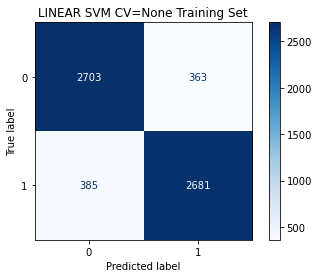

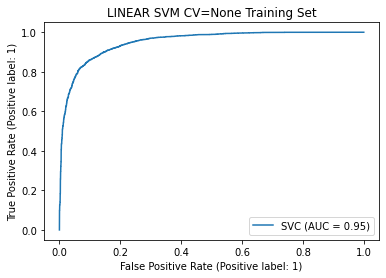

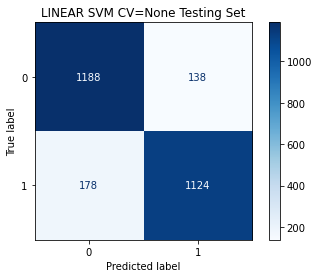

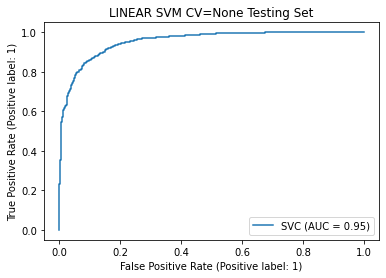

In [20]:
starttime= datetime.now()
SVMlinearClassifier = svm.SVC(kernel = 'linear', random_state = 42)
SVMlinearClassifier.fit(X_train,y_train)
stoptime= datetime.now()
    
ShowTestResults(SVMlinearClassifier, Title="LINEAR SVM CV=None", AUC_On = False)
ShowCMandROC(SVMlinearClassifier, Title="LINEAR SVM CV=None")

### SVM kernel='poly'


TEST DATA RESULTS :  Poly SVM CV=None 
***************************************
         Accuracy :  0.9189497716894978
Balanced accuracy :  0.918876980072426
        Precision :  0.9243959469992206
           Recall :  0.9109062980030722
      Sensitivity :  0.9109062980030722
      Specificity :  0.9268476621417798


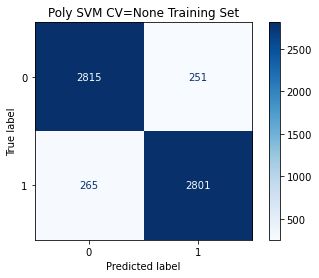

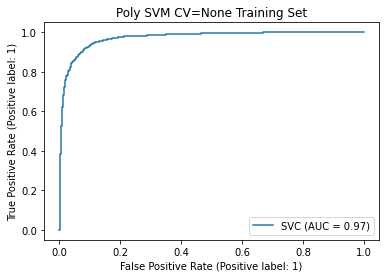

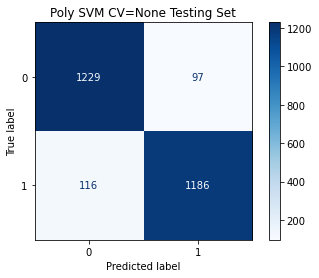

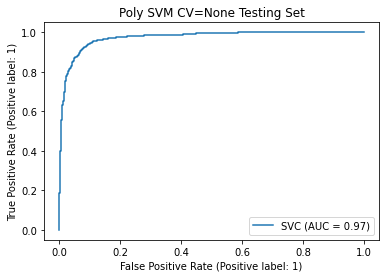

In [21]:
starttime= datetime.now()
SVMpolyClassifier = svm.SVC(kernel = 'poly', random_state = 42)
SVMpolyClassifier.fit(X_train,y_train)
stoptime= datetime.now()

ShowTestResults(SVMpolyClassifier, Title="Poly SVM CV=None", AUC_On = False)
ShowCMandROC(SVMpolyClassifier, Title="Poly SVM CV=None")

# SVM kernel='rbf'


TEST DATA RESULTS :  RBF SVM CV=None 
***************************************
         Accuracy :  0.91324200913242
Balanced accuracy :  0.9130888087244824
        Precision :  0.9261904761904762
           Recall :  0.8963133640552995
      Sensitivity :  0.8963133640552995
      Specificity :  0.9298642533936652


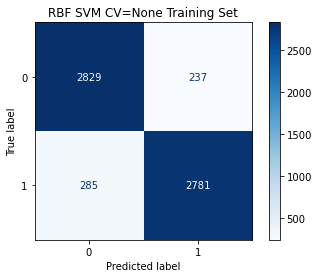

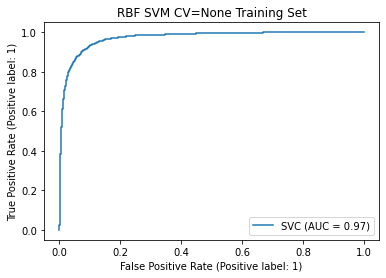

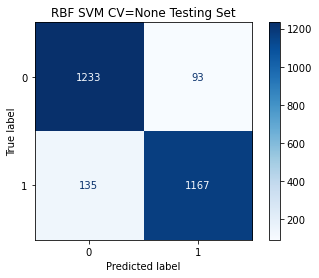

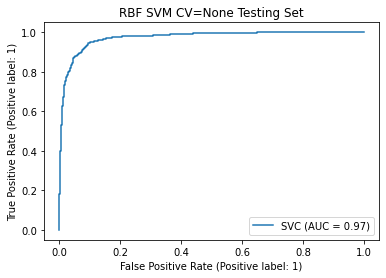

In [22]:
starttime= datetime.now()
SVMrbfClassifier = svm.SVC(kernel = 'rbf', random_state = 42)
SVMrbfClassifier.fit(X_train,y_train)
stoptime= datetime.now()

ShowTestResults(SVMrbfClassifier, Title="RBF SVM CV=None", AUC_On = False)
ShowCMandROC(SVMrbfClassifier, Title="RBF SVM CV=None")

# CROSSVALIDATION GRIDSEARCH 
Rerun Linear, Poly, RBF using Gridsearch for tuning with hyperparameters & CrossValidation = 5 

## SVC(kernel = 'linear'), Hyperparameters:{C}, CV = 5

In [23]:
#    Define Function
linear_svc = SVC(random_state = 42, kernel = 'linear', probability=True) # must specify random state here

#    Define a list of hyperparameters
params_svc = {'C':  [0.001, 0.01, 0.1, 1, 10, 100, 1000,10000]}

#    Create GridSearchCV for our function
grid_lr_svc = GridSearchCV(linear_svc, params_svc, n_jobs = -1, cv=5, refit=True)

#    Fit GridSearchCV to our training data
GridCV5linear=grid_lr_svc.fit(X_train, y_train)

In [24]:
GridCV5linear.best_params_, GridCV5linear.best_score_

print("Best Params: " , GridCV5linear.best_params_, "       Best Score: ", GridCV5linear.best_score_)
LinearCV5df = pd.DataFrame(GridCV5linear.cv_results_)
LinearCV5df

Best Params:  {'C': 1000}        Best Score:  0.8843770732206698


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,5.342,0.269,0.175,0.011,0.001,{'C': 0.001},0.832,0.813,0.816,0.827,0.817,0.821,0.007,8
1,3.712,0.319,0.105,0.008,0.01,{'C': 0.01},0.851,0.852,0.845,0.848,0.848,0.849,0.002,7
2,2.377,0.121,0.075,0.003,0.1,{'C': 0.1},0.879,0.868,0.863,0.874,0.877,0.872,0.006,6
3,2.481,0.225,0.075,0.009,1,{'C': 1},0.878,0.870,0.875,0.879,0.878,0.876,0.004,5
4,3.907,0.076,0.064,0.009,10,{'C': 10},0.887,0.879,0.879,0.883,0.879,0.882,0.003,4
5,10.657,0.205,0.047,0.010,100,{'C': 100},0.886,0.882,0.880,0.890,0.880,0.884,0.004,3
6,52.269,2.581,0.049,0.016,1000,{'C': 1000},0.885,0.883,0.882,0.889,0.883,0.884,0.003,1
7,349.024,18.544,0.029,0.010,10000,{'C': 10000},0.884,0.882,0.881,0.890,0.883,0.884,0.003,2


TEST DATA RESULTS :  LINEAR SVM CV=5 
***************************************
         Accuracy :  0.8873668188736682
Balanced accuracy :  0.8872392629508379
        Precision :  0.8966876971608833
           Recall :  0.8732718894009217
              AUC :  0.9610936185888747
      Sensitivity :  0.8732718894009217
      Specificity :  0.9012066365007542


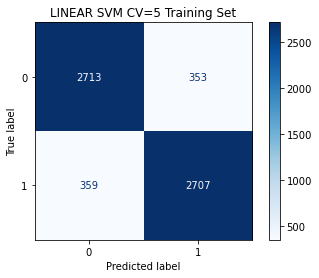

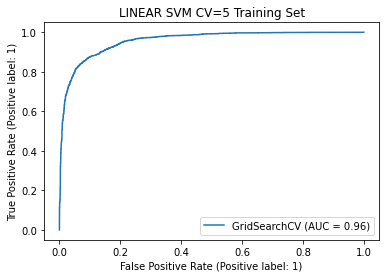

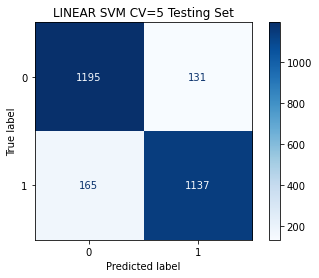

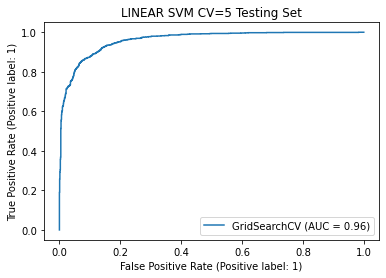

In [25]:
ShowTestResults(GridCV5linear, Title="LINEAR SVM CV=5", AUC_On = True)
ShowCMandROC(GridCV5linear, Title="LINEAR SVM CV=5")

Text(0.5, 1.0, 'Linear SVM CV = 5')

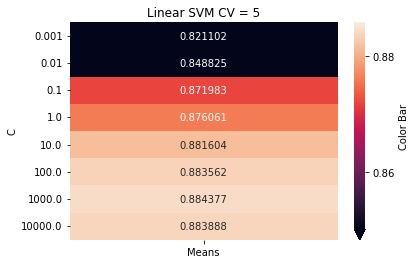

In [26]:
CvResults = pd.DataFrame(GridCV5linear.cv_results_)
Zmean = CvResults.mean_test_score
XC= CvResults.param_C


data = pd.DataFrame({'C': XC, 'Means':Zmean})
data

data_pivoted = pd.pivot_table(data,index=['C'],  values = "Means")

#    color bar keyword arguments
cbar_kws = {#"shrink":1,
            'extend':'min', 
            #'extendfrac':.1, 
            #"drawedges":True, 
            'ticks': [.8,.82,.84,.86,.88,.9], # set ticks of color bar
            'label':'Color Bar'}

ax = sns.heatmap(data_pivoted, annot=True, cbar_kws=cbar_kws, vmin = .85 , vmax =.8859,fmt ='.6f')
ax.set_title("Linear SVM CV = 5")





In [27]:
LinearCV5df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,5.342,0.269,0.175,0.011,0.001,{'C': 0.001},0.832,0.813,0.816,0.827,0.817,0.821,0.007,8
1,3.712,0.319,0.105,0.008,0.01,{'C': 0.01},0.851,0.852,0.845,0.848,0.848,0.849,0.002,7
2,2.377,0.121,0.075,0.003,0.1,{'C': 0.1},0.879,0.868,0.863,0.874,0.877,0.872,0.006,6
3,2.481,0.225,0.075,0.009,1,{'C': 1},0.878,0.870,0.875,0.879,0.878,0.876,0.004,5
4,3.907,0.076,0.064,0.009,10,{'C': 10},0.887,0.879,0.879,0.883,0.879,0.882,0.003,4
5,10.657,0.205,0.047,0.010,100,{'C': 100},0.886,0.882,0.880,0.890,0.880,0.884,0.004,3
6,52.269,2.581,0.049,0.016,1000,{'C': 1000},0.885,0.883,0.882,0.889,0.883,0.884,0.003,1
7,349.024,18.544,0.029,0.010,10000,{'C': 10000},0.884,0.882,0.881,0.890,0.883,0.884,0.003,2


<AxesSubplot:xlabel='param_C'>

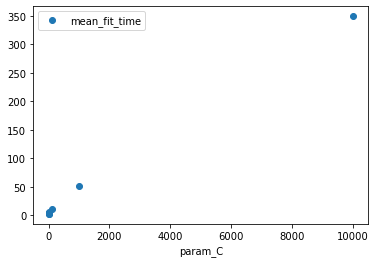

In [28]:
LinearCV5df.plot(x='param_C', y='mean_fit_time', style='o')



## Poly SVM Hyperparameters:{degree}, CV = 5


In [29]:
#    Define Function
poly_svc = SVC(random_state = 42, kernel = 'poly', probability=True ) # must specify random state here

#    Define a list of hyperparameters
params_svc = {'degree':  [1,2,3,4,5,6,7,8,9,10,11] }

#    Create GridSearchCV for our function
grid_poly_svc = GridSearchCV(poly_svc, params_svc, n_jobs = -1, cv=5, refit=True)

#    Fit GridSearchCV to our training data
GridCV5Poly = grid_poly_svc.fit(X_train, y_train)


In [30]:
print("Best Params: " , GridCV5Poly.best_params_, "       Best Score: ", GridCV5Poly.best_score_)
PolyCV5df = pd.DataFrame(GridCV5Poly.cv_results_)
PolyCV5df

Best Params:  {'degree': 4}        Best Score:  0.908677246988969


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_degree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,2.942,0.138,0.141,0.017,1,{'degree': 1},0.883,0.866,0.870,0.881,0.875,0.875,0.006,10
1,3.731,0.510,0.122,0.020,2,{'degree': 2},0.890,0.909,0.912,0.901,0.907,0.904,0.008,6
2,3.579,0.059,0.117,0.008,3,{'degree': 3},0.895,0.907,0.918,0.908,0.910,0.908,0.008,3
3,4.327,0.462,0.133,0.013,4,{'degree': 4},0.899,0.910,0.912,0.910,0.913,0.909,0.005,1
4,4.403,0.346,0.143,0.005,5,{'degree': 5},0.901,0.913,0.914,0.905,0.911,0.909,0.005,2
5,4.881,0.279,0.152,0.024,6,{'degree': 6},0.896,0.911,0.917,0.905,0.904,0.906,0.007,4
6,5.223,0.437,0.145,0.015,7,{'degree': 7},0.891,0.914,0.907,0.903,0.904,0.904,0.007,7
7,6.165,0.527,0.167,0.023,8,{'degree': 8},0.884,0.915,0.903,0.898,0.902,0.901,0.010,9
8,6.489,0.199,0.152,0.015,9,{'degree': 9},0.891,0.918,0.905,0.896,0.908,0.904,0.009,8
9,5.282,0.135,0.101,0.038,10,{'degree': 10},0.897,0.911,0.907,0.900,0.909,0.905,0.005,5


TEST DATA RESULTS :  Poly SVM CV=5 
***************************************
         Accuracy :  0.921613394216134
Balanced accuracy :  0.9215512507732622
        Precision :  0.9261275272161742
           Recall :  0.9147465437788018
              AUC :  0.9720339748802747
      Sensitivity :  0.9147465437788018
      Specificity :  0.9283559577677225


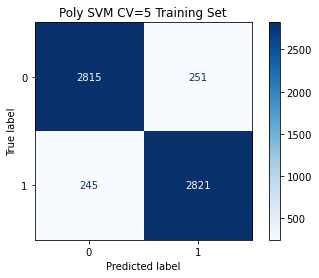

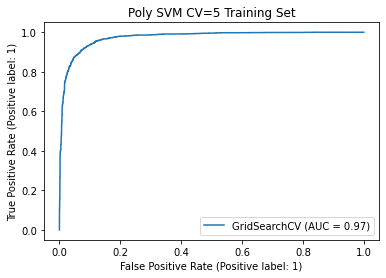

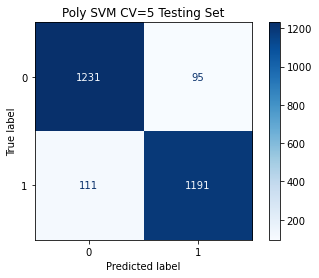

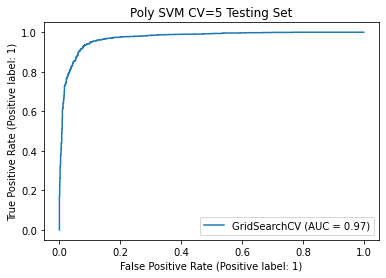

In [31]:
ShowTestResults(GridCV5Poly, Title="Poly SVM CV=5", AUC_On = True)
ShowCMandROC(GridCV5Poly, Title="Poly SVM CV=5")

Text(0.5, 1.0, 'Poly SVM CV = 5')

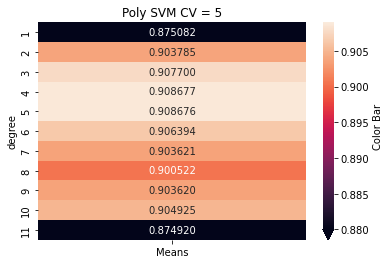

In [32]:
CvResults = pd.DataFrame(GridCV5Poly.cv_results_)
Zmean = CvResults.mean_test_score
Xdegree= CvResults.param_degree


data = pd.DataFrame({'degree': Xdegree, 'Means':Zmean})
data

#    data_pivoted = data.pivot("C", "Gamma", "Means")
data_pivoted = pd.pivot_table(data,index=['degree'],  values = "Means")

#    color bar keyword arguments
cbar_kws = {#"shrink":1,
            'extend':'min', 
            #'extendfrac':.1, 
            #"drawedges":True, 
            'ticks': [.88, .885, .89, .895, .9, .905], # set ticks of color bar
            'label':'Color Bar'}
ax = sns.heatmap(data_pivoted, annot=True, cbar_kws=cbar_kws, vmin = .88, vmax = 0.909, fmt ='.6f')
ax.set_title("Poly SVM CV = 5")


<AxesSubplot:xlabel='param_degree'>

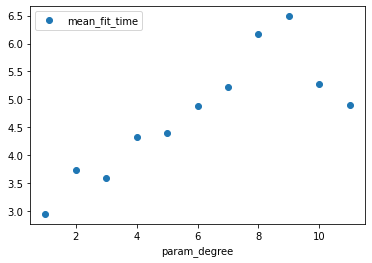

In [33]:
PolyCV5df.plot(x='param_degree', y='mean_fit_time', style='o')

## RBF SVM Hyperparameters:{C, Gamma}, CV = 5 

In [34]:
#    Define Function
svc_kernel = SVC(random_state = 42, kernel = 'rbf', probability= True) # must specify random state here

#    define a list of hyperparameters
param_svc = {'C':  [0.001, 0.01, 0.1, 1, 10, 100, 10000]     ,
                    'gamma':   [0.0001, 0.001,0.001,0.1,1,10]   } # C = 10,000 mimics hard-margin SVM

#    apply grid search
grid_rbf_svc = GridSearchCV(svc_kernel, param_svc, n_jobs=-1, cv = 5, refit = True)

#    Fit GridSearchCV to our training data
GridCV5RBF = grid_rbf_svc.fit(X_train, y_train)


In [35]:
print("Best Params: " , GridCV5RBF.best_params_, "       Best Score: ", GridCV5RBF.best_score_)
RBFCV5df = pd.DataFrame(GridCV5RBF.cv_results_)
RBFCV5df

Best Params:  {'C': 100, 'gamma': 0.1}        Best Score:  0.914221479463565


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,15.104,0.745,1.292,0.059,0.001,0.0,"{'C': 0.001, 'gamma': 0.0001}",0.500,0.500,0.782,0.790,0.794,0.673,0.142,37
1,15.368,1.192,1.233,0.062,0.001,0.001,"{'C': 0.001, 'gamma': 0.001}",0.500,0.500,0.785,0.792,0.793,0.674,0.142,33
2,15.289,0.948,1.235,0.036,0.001,0.001,"{'C': 0.001, 'gamma': 0.001}",0.500,0.500,0.785,0.792,0.793,0.674,0.142,33
3,14.951,1.189,1.208,0.013,0.001,0.1,"{'C': 0.001, 'gamma': 0.1}",0.500,0.500,0.800,0.809,0.809,0.684,0.150,32
4,15.073,1.113,1.220,0.056,0.001,1,"{'C': 0.001, 'gamma': 1}",0.500,0.500,0.748,0.737,0.768,0.650,0.124,40
5,14.812,1.155,1.245,0.063,0.001,10,"{'C': 0.001, 'gamma': 10}",0.500,0.500,0.619,0.702,0.604,0.585,0.077,41
6,15.326,1.844,1.278,0.076,0.01,0.0,"{'C': 0.01, 'gamma': 0.0001}",0.500,0.500,0.782,0.790,0.794,0.673,0.142,37
7,14.661,0.750,1.222,0.070,0.01,0.001,"{'C': 0.01, 'gamma': 0.001}",0.500,0.500,0.785,0.792,0.793,0.674,0.142,33
8,14.065,0.137,1.194,0.047,0.01,0.001,"{'C': 0.01, 'gamma': 0.001}",0.500,0.500,0.785,0.792,0.793,0.674,0.142,33
9,10.886,0.496,0.885,0.047,0.01,0.1,"{'C': 0.01, 'gamma': 0.1}",0.842,0.832,0.833,0.841,0.838,0.837,0.004,23


TEST DATA RESULTS :  RBF SVM CV=5 
***************************************
         Accuracy :  0.9277016742770168
Balanced accuracy :  0.9276956440144296
        Precision :  0.9270353302611367
           Recall :  0.9270353302611367
              AUC :  0.97687540690387
      Sensitivity :  0.9270353302611367
      Specificity :  0.9283559577677225


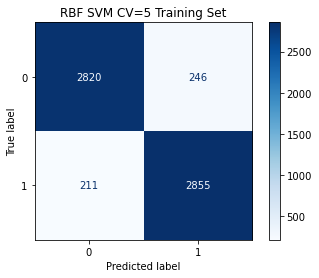

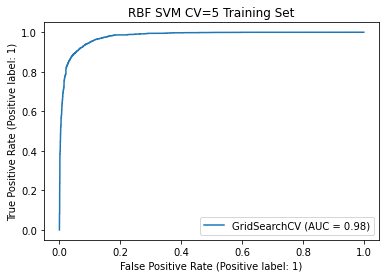

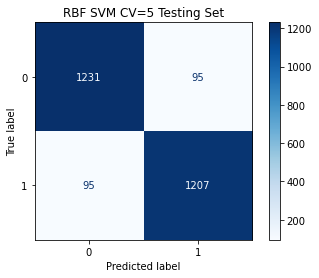

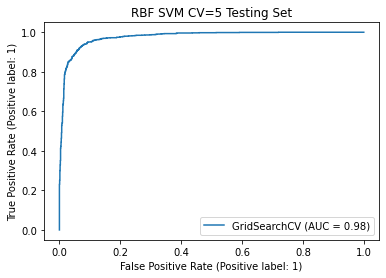

In [36]:
ShowTestResults(GridCV5RBF, Title="RBF SVM CV=5", AUC_On = True)
ShowCMandROC(GridCV5RBF, Title="RBF SVM CV=5")

Text(0.5, 1.0, 'RBF SVM CV = 5')

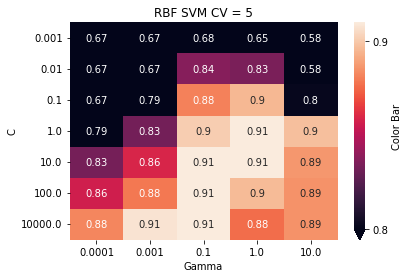

In [37]:
CvResults = pd.DataFrame(GridCV5RBF.cv_results_)#.loc['mean_test_score' ]
Zmean = CvResults.mean_test_score
XC= CvResults.param_C
YGamma= CvResults.param_gamma

data = pd.DataFrame({'C': XC, 'Gamma': YGamma, 'Means':Zmean})
data

#    data_pivoted = data.pivot("C", "Gamma", "Means")
data_pivoted = pd.pivot_table(data,index=['C'], columns = 'Gamma', values = "Means")

#    color bar keyword arguments
cbar_kws = {#"shrink":1,
            'extend':'min', 
            #'extendfrac':.1, 
            #"drawedges":True, 
            'ticks': [0.5, 0.6, .7,.8,.9, 1.0], # set ticks of color bar
            'label':'Color Bar'}
ax = sns.heatmap(data_pivoted, annot=True, cbar_kws=cbar_kws, vmin = .80 , vmax =.91)
ax.set_title("RBF SVM CV = 5")

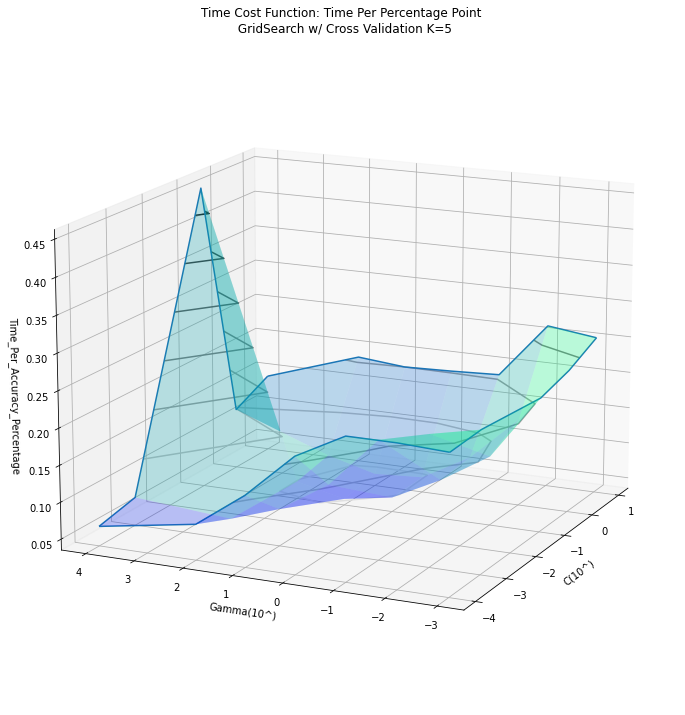

In [38]:
CostFigure3D(TransformRBF(RBFCV5df, CrossVal = 5).loc[:,['param_gamma','param_C','Time_Per_Accuracy_Percentage']], 
             ['C(10^)', 'Gamma(10^)',  'Time_Per_Accuracy_Percentage'], 
             Title = ("Time Cost Function: Time Per Percentage Point \n GridSearch w/ Cross Validation K=5"), 
             Elev = 15, Azim = 205)

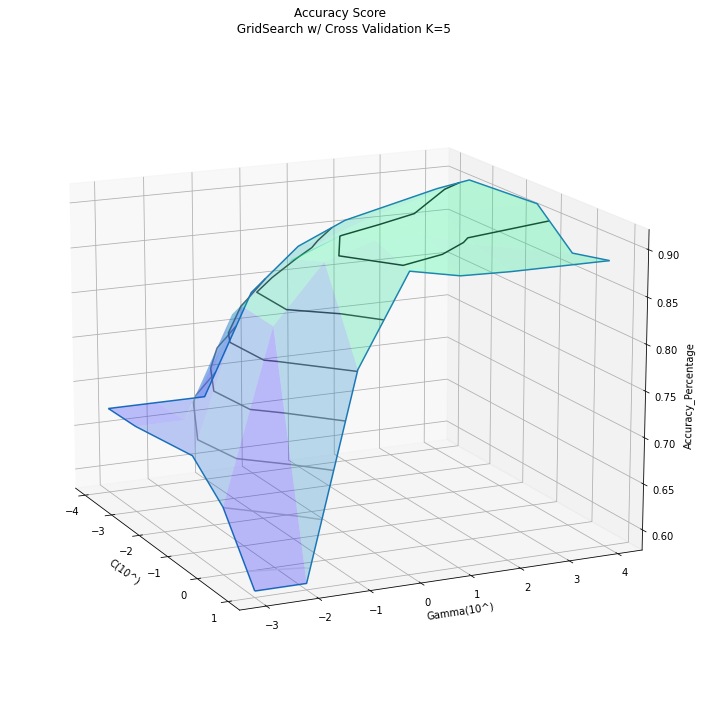

In [39]:
CostFigure3D(TransformRBF(RBFCV5df, CrossVal = 5).loc[:,['param_gamma','param_C','mean_test_score']], 
             ['C(10^)', 'Gamma(10^)',  'Accuracy_Percentage'], 
             Title = ("Accuracy Score \n GridSearch w/ Cross Validation K=5"), 
             Elev = 15, Azim = 335)

# REDO EVERYTHING WITH CV = 10
Re Run the Linear, Poly, and RBF Gridsearch Tests with CV = 10 instead of CV = 5

## SVC(kernel = 'linear'), Hyperparameters:{C}, CV = 10

In [40]:
#    Define Function
linear_svc = SVC(random_state = 42, kernel = 'linear', probability=True) # must specify random state here

#    Define a list of hyperparameters
params_svc = {'C':  [0.001, 0.01, 0.1, 1, 10, 100, 1000,10000]}
 
#    Create GridSearchCV for our function
grid_lr_svc = GridSearchCV(linear_svc, params_svc, n_jobs = -1, cv=10, refit=True)

#    Fit GridSearchCV to our training data
GridCV10linear=grid_lr_svc.fit(X_train, y_train)
GridCV10linear.best_params_, GridCV10linear.best_score_

print("Best Params: " , GridCV10linear.best_params_, "       Best Score: ", GridCV10linear.best_score_)


Best Params:  {'C': 10000}        Best Score:  0.8824194568284349


TEST DATA RESULTS :  LINEAR SVM CV=10 
***************************************
         Accuracy :  0.8881278538812786
Balanced accuracy :  0.8880003614348966
        Precision :  0.8974763406940063
           Recall :  0.8740399385560675
              AUC :  0.9610878263629687
      Sensitivity :  0.8740399385560675
      Specificity :  0.9019607843137255


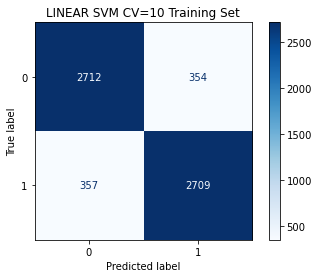

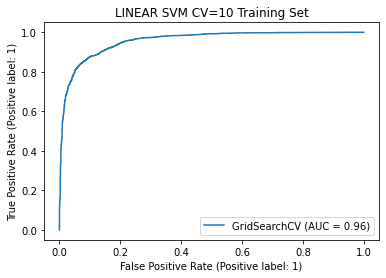

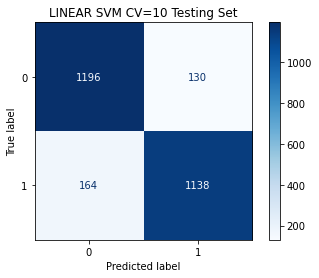

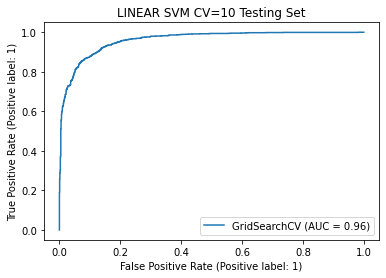

In [41]:
ShowTestResults(GridCV10linear, Title="LINEAR SVM CV=10", AUC_On = True)
ShowCMandROC(GridCV10linear, Title="LINEAR SVM CV=10")

Text(0.5, 1.0, 'Linear SVM CV = 10')

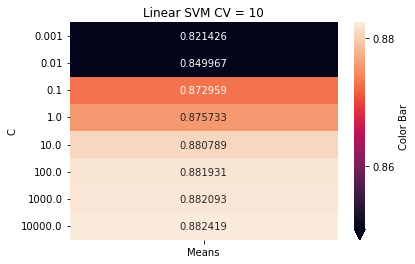

In [42]:
CvResults = pd.DataFrame(GridCV10linear.cv_results_)#.loc['mean_test_score' ]
Zmean = CvResults.mean_test_score
XC= CvResults.param_C


data = pd.DataFrame({'C': XC, 'Means':Zmean})
data

data_pivoted = pd.pivot_table(data,index=['C'],  values = "Means")

#    color bar keyword arguments
cbar_kws = {#"shrink":1,
            'extend':'min', 
            #'extendfrac':.1, 
            #"drawedges":True, 
            'ticks': [.8,.82,.84,.86,.88,.9], # set ticks of color bar
            'label':'Color Bar'}

ax = sns.heatmap(data_pivoted, annot=True, cbar_kws=cbar_kws, vmin = .85 , vmax =.8825,fmt ='.6f')
ax.set_title("Linear SVM CV = 10")

## Poly SVM Hyperparameters:{degree}, CV = 10

In [43]:
#    Define Function
poly_svc = SVC(random_state = 42, kernel = 'poly', probability=True ) # must specify random state here

#    Define a list of hyperparameters
params_svc = {'degree':  [1,2,3,4,5,6,7,8,9,10,11] }

#    Create GridSearchCV for our function
grid_poly_svc = GridSearchCV(poly_svc, params_svc, n_jobs = -1, cv=10, refit=True)

#    Fit GridSearchCV to our training data
GridCV10Poly = grid_poly_svc.fit(X_train, y_train)



print("Best Params: " , GridCV10Poly.best_params_, "       Best Score: ", GridCV10Poly.best_score_)




Best Params:  {'degree': 5}        Best Score:  0.9101455436232339


TEST DATA RESULTS :  Poly SVM CV=10 
***************************************
         Accuracy :  0.9193302891933028
Balanced accuracy :  0.9192123499523879
        Precision :  0.9291338582677166
           Recall :  0.9062980030721967
              AUC :  0.9700617219592552
      Sensitivity :  0.9062980030721967
      Specificity :  0.9321266968325792


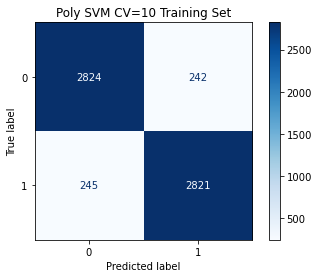

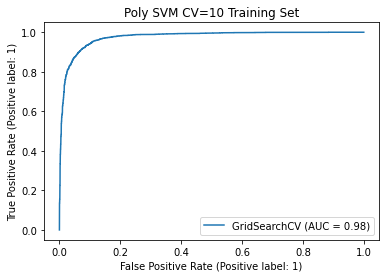

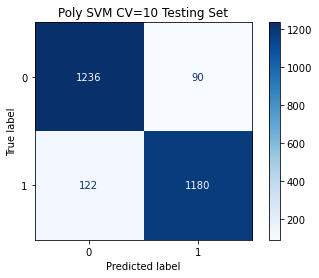

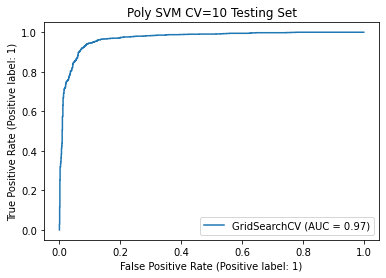

In [44]:
ShowTestResults(GridCV10Poly, Title="Poly SVM CV=10", AUC_On = True)
ShowCMandROC(GridCV10Poly, Title="Poly SVM CV=10")

Text(0.5, 1.0, 'Poly SVM CV = 10')

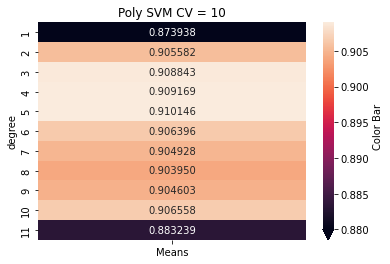

In [45]:
CvResults = pd.DataFrame(GridCV10Poly.cv_results_)#.loc['mean_test_score' ]
Zmean = CvResults.mean_test_score
Xdegree= CvResults.param_degree


data = pd.DataFrame({'degree': Xdegree, 'Means':Zmean})
data

data_pivoted = pd.pivot_table(data,index=['degree'],  values = "Means")

#    color bar keyword arguments
cbar_kws = {#"shrink":1,
            'extend':'min', 
            #'extendfrac':.1, 
            #"drawedges":True, 
            'ticks': [.88, .885, .89, .895, .9, .905], # set ticks of color bar
            'label':'Color Bar'}
ax = sns.heatmap(data_pivoted, annot=True, cbar_kws=cbar_kws, vmin = .88, vmax = 0.909, fmt ='.6f')
ax.set_title("Poly SVM CV = 10")

## RBF SVM Hyperparameters:{C, Gamma}, CV = 10 

In [46]:
#    Define Function
svc_kernel = SVC(random_state = 42, kernel = 'rbf', probability= True) # must specify random state here

#    define a list of hyperparameters
param_svc = {'C':  [0.001, 0.01, 0.1, 1, 10, 100, 10000]     ,
                    'gamma':   [0.0001, 0.001,0.001,0.1,1,10]   } # C = 10,000 mimics hard-margin SVM

#    apply grid search
grid_rbf_svc = GridSearchCV(svc_kernel, param_svc, n_jobs=-1, cv = 10, refit = True)

#    Fit GridSearchCV to our training data
GridCV10RBF = grid_rbf_svc.fit(X_train, y_train)



print("Best Params: " , GridCV10RBF.best_params_, "       Best Score: ", GridCV10RBF.best_score_)


Best Params:  {'C': 10, 'gamma': 1}        Best Score:  0.9151999829959987


TEST DATA RESULTS :  RBF SVM CV=10 
***************************************
         Accuracy :  0.9208523592085236
Balanced accuracy :  0.9208040536313782
        Precision :  0.924031007751938
           Recall :  0.9155145929339478
              AUC :  0.9688722883694421
      Sensitivity :  0.9155145929339478
      Specificity :  0.9260935143288085


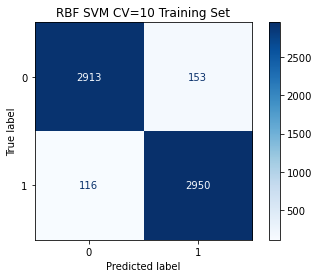

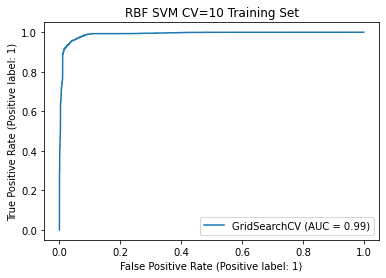

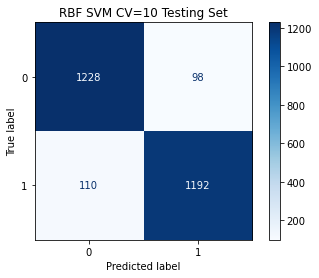

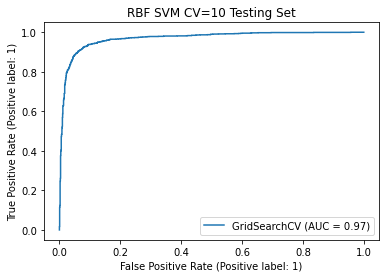

In [47]:
ShowTestResults(GridCV10RBF, Title="RBF SVM CV=10", AUC_On = True)
ShowCMandROC(GridCV10RBF, Title="RBF SVM CV=10")

Text(0.5, 1.0, 'RBF SVM CV = 10')

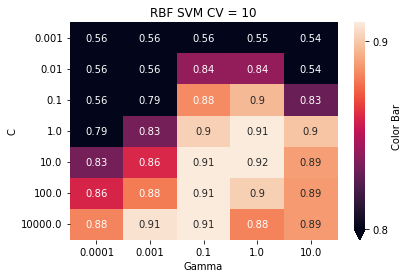

In [48]:
CvResults = pd.DataFrame(GridCV10RBF.cv_results_)#.loc['mean_test_score' ]
Zmean = CvResults.mean_test_score
XC= CvResults.param_C
YGamma= CvResults.param_gamma

data = pd.DataFrame({'C': XC, 'Gamma': YGamma, 'Means':Zmean})
data

#    data_pivoted = data.pivot("C", "Gamma", "Means")
data_pivoted = pd.pivot_table(data,index=['C'], columns = 'Gamma', values = "Means")

#    color bar keyword arguments
cbar_kws = {#"shrink":1,
            'extend':'min', 
            #'extendfrac':.1, 
            #"drawedges":True, 
            'ticks': [0.5, 0.6, .7,.8,.9, 1.0], # set ticks of color bar
            'label':'Color Bar'}
ax = sns.heatmap(data_pivoted, annot=True, cbar_kws=cbar_kws, vmin = .80 , vmax =.91)
ax.set_title("RBF SVM CV = 10")

In [49]:
RBFCV10df = pd.DataFrame(GridCV10RBF.cv_results_)
RBFCV10df
TransformRBF(RBFCV10df, CrossVal = 10).head()

,param_C,param_gamma,mean_fit_time,mean_score_time,mean_test_score,Total_Time,Time_Per_Accuracy_Percentage
0,-3.0,-4.0,21.711,0.749,0.556,224.595,0.390
1,-3.0,-3.0,21.899,0.768,0.557,226.673,0.393
2,-3.0,-3.0,20.425,0.766,0.557,211.907,0.367
3,-3.0,-1.0,19.861,0.762,0.562,206.232,0.353
4,-3.0,0.0,20.279,0.729,0.551,210.080,0.368


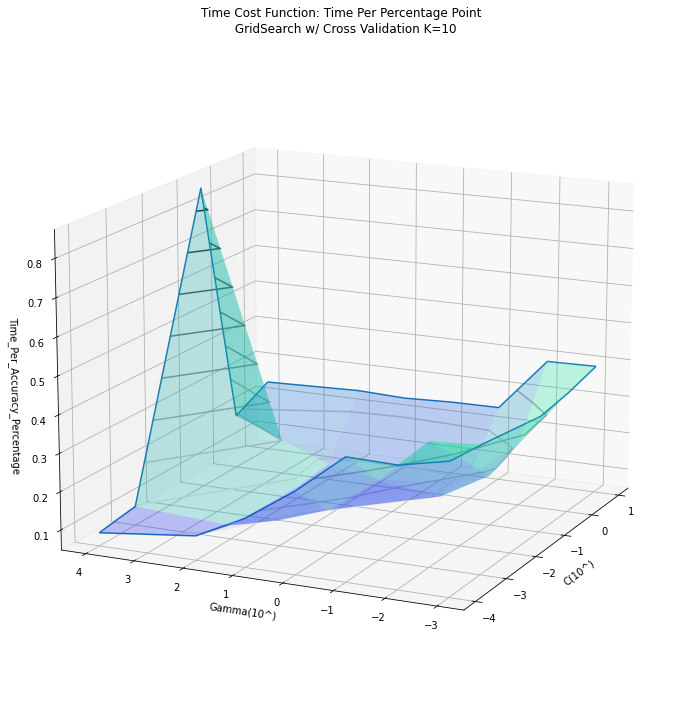

In [50]:
CostFigure3D(TransformRBF(RBFCV10df, CrossVal = 10).loc[:,['param_gamma','param_C','Time_Per_Accuracy_Percentage']], 
             ['C(10^)', 'Gamma(10^)',  'Time_Per_Accuracy_Percentage'], 
             Title = ("Time Cost Function: Time Per Percentage Point \n GridSearch w/ Cross Validation K=10"), 
             Elev = 15, Azim = 205)

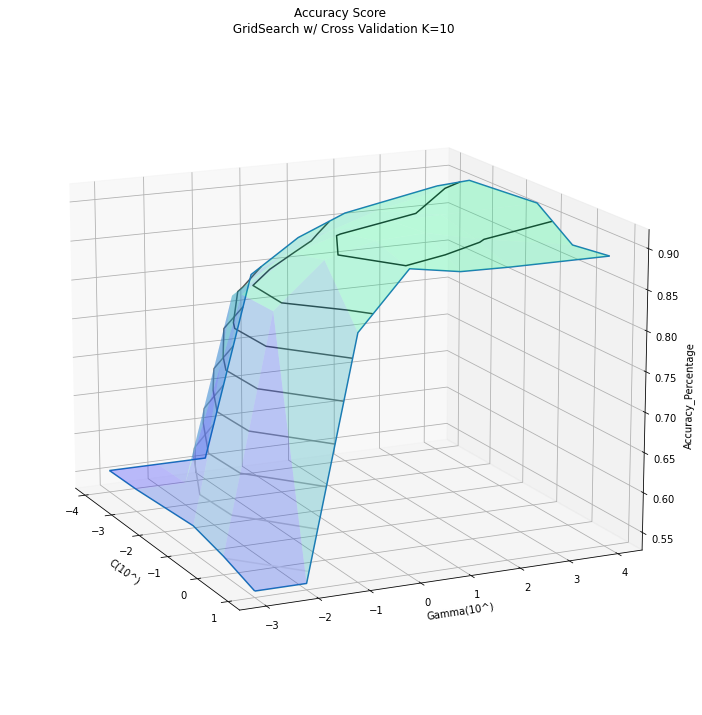

In [51]:
CostFigure3D(TransformRBF(RBFCV10df, CrossVal = 10).loc[:,['param_gamma','param_C','mean_test_score']], 
             ['C(10^)', 'Gamma(10^)',  'Accuracy_Percentage'], 
             Title = ("Accuracy Score \n GridSearch w/ Cross Validation K=10"), 
             Elev = 15, Azim = 335)

# PART 2-------------------DECISION TREE
For this part of the assignment, we want to reload the data since our regression and SVM models used normalized data and the decision tree interpretability is easier if we take a different approach.  For simplicity and time saving, I just copied and pasted everything from the initial data transformation and then changed course at the feature deletion section. 

In [52]:
#    Import necessary libraries 
import numpy as np
import pandas as pd
#import datetime
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from datetime import datetime

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
# import necessary libraries and specify that graphs should be plotted inline. 
import matplotlib.pyplot as plt
import numpy as np

import pylab as pl

from sklearn import tree
from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import plot_confusion_matrix

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, auc


In [53]:
#    Import data
pdBikeData = pd.read_csv("SeoulBikeData.csv")

### Manipulate Data As Needed (Global)
<li>Verify no nulls
<li>Verify data structure integrity - Fix if needed
<li>Transform Categorical Data

In [54]:
def printif(ShowWork = True, StringToPrint=""):
    if ShowWork: print(StringToPrint)
        
def displayif(ShowWork = True, dataframe = []):
    if ShowWork: display(dataframe)
        
        
#    option modifications
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 50)
pd.set_option('display.width', 1000)
pd.set_option('display.colheader_justify', 'center')
pd.set_option('display.precision', 3)

ShowWork = True  #Set to true if you want to see work, False if work should be hidden

#    import data
pdBikeData = pd.read_csv("SeoulBikeData.csv")
##    attempted to save csv file as UTF 8 but still generated: "UnicodeDecodeError: 'utf-8' codec can't decode byte 0xb0 in position 40: invalid start byte"
##    adjusted csv header to delete the degree symbol in the two temperature columns.  Replaced symbol with a "d".

In [55]:
#    Check for null values
printif(ShowWork, "Total Amount of Null Values in Data:" + str(pdBikeData.isnull().sum().sum()))
#    Inspect data
printif(ShowWork, "Original Header Output:" )
displayif(ShowWork, pdBikeData.head())

##   1st column header was not included.  Add "Date" as first column header and remove "Unnamed: 13"
pdBikeData.columns = ["Date"] + pdBikeData.columns[0:-1].tolist()

#    Verify formating now correct
printif(ShowWork, '\n\nAfter adjusting the Header to include Date:')
displayif(ShowWork, pdBikeData.head())

printif(ShowWork, "\n\nNow we need to transform all of the Categorical Data to include in Regression...")
#    Convert four Seasons Categorical Data to 3 individual columns
printif(ShowWork, "The Seasons categories are:" )
printif(ShowWork, pdBikeData['Seasons'].unique())
printif(ShowWork, "Creating Spring, Summer, and Autumn columns")
#    Add 3 Columns (exclude 4th column as it is redundant when you know the other 3)
pdBikeData.insert(12, 'Winter', (pdBikeData[["Seasons"]] == "Winter") * 1, allow_duplicates=False)
pdBikeData.insert(12, 'Autumn', (pdBikeData[["Seasons"]] == "Autumn") * 1, allow_duplicates=False)
pdBikeData.insert(12, 'Summer', (pdBikeData[["Seasons"]] == "Summer") * 1, allow_duplicates=False)
pdBikeData.insert(12, 'Spring', (pdBikeData[["Seasons"]] == "Spring") * 1, allow_duplicates=False)

#    Delete Original Seasons Column
#************leaving in for decision tree*******************************del pdBikeData['Seasons']
#    Add Column for intercept X0=1 value
pdBikeData.insert(2, "X0", 1, allow_duplicates=False)

#    Convert Holiday column to 1/0 representation
printif(ShowWork, "\nThe Holiday categories are:" )
printif(ShowWork, pdBikeData['Holiday'].unique())
printif(ShowWork, "Converting to 1/0 (Holiday/No Holiday)")
pdBikeData['Holiday'] = (pdBikeData['Holiday']=='Holiday') * 1

#    Convert Functioning Day column to 1/0 representation
printif(ShowWork, "\nThe Functioning Day categories are:" )
printif(ShowWork, pdBikeData['Functioning Day'].unique())
printif(ShowWork, "Converting to 1/0 (Yes/No)")
pdBikeData['Functioning Day']=(pdBikeData['Functioning Day']=='Yes') * 1



print("\n\nOur updated dataframe ready for regression:")
display(pdBikeData)

Total Amount of Null Values in Data:0
Original Header Output:


,Rented Bike Count,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,Unnamed: 13
0,1/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,1/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,1/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,1/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,1/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes




After adjusting the Header to include Date:


,Date,Rented Bike Count,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,1/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,1/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,1/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,1/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,1/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes




Now we need to transform all of the Categorical Data to include in Regression...
The Seasons categories are:
['Winter' 'Spring' 'Summer' 'Autumn']
Creating Spring, Summer, and Autumn columns

The Holiday categories are:
['No Holiday' 'Holiday']
Converting to 1/0 (Holiday/No Holiday)

The Functioning Day categories are:
['Yes' 'No']
Converting to 1/0 (Yes/No)


Our updated dataframe ready for regression:


,Date,Rented Bike Count,X0,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Spring,Summer,Autumn,Winter,Holiday,Functioning Day
0,1/12/2017,254,1,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
1,1/12/2017,204,1,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
2,1/12/2017,173,1,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,0,0,0,1,0,1
3,1/12/2017,107,1,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
4,1/12/2017,78,1,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,1,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,0,0,1,0,0,1
8756,30/11/2018,764,1,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,0,0,1,0,0,1
8757,30/11/2018,694,1,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,0,0,1,0,0,1
8758,30/11/2018,712,1,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,0,0,1,0,0,1


In [56]:
#    Create DayofWeek indicator 
DayofWeek = pd.to_datetime(pdBikeData["Date"], errors='ignore', format = '%mm%dd%YYYY')
Day = pd.to_datetime(DayofWeek, errors='ignore')
X=pdBikeData["X0"].copy()
for i in range (0, len(pdBikeData)):
    X[i] = Day[i].weekday()

pdBikeData.insert(2, 'DayOfWeek', X, allow_duplicates=False)
pdBikeData

,Date,Rented Bike Count,DayOfWeek,X0,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Spring,Summer,Autumn,Winter,Holiday,Functioning Day
0,1/12/2017,254,3,1,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
1,1/12/2017,204,3,1,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
2,1/12/2017,173,3,1,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,0,0,0,1,0,1
3,1/12/2017,107,3,1,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
4,1/12/2017,78,3,1,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,4,1,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,0,0,1,0,0,1
8756,30/11/2018,764,4,1,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,0,0,1,0,0,1
8757,30/11/2018,694,4,1,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,0,0,1,0,0,1
8758,30/11/2018,712,4,1,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,0,0,1,0,0,1


In [57]:
X_train, X_test, y_train, y_test = train_test_split(pdBikeData, pdBikeData['Rented Bike Count'], test_size = 0.3 , random_state=42)

display(X_train)

,Date,Rented Bike Count,DayOfWeek,X0,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Spring,Summer,Autumn,Winter,Holiday,Functioning Day
1444,30/01/2018,33,1,1,4,-11.1,50,1.2,1986,-19.4,0.00,0.0,0.0,Winter,0,0,0,1,0,1
1652,7/2/2018,218,0,1,20,-5.8,44,2.1,1994,-16.1,0.00,0.0,0.0,Winter,0,0,0,1,0,1
7496,9/10/2018,0,0,1,8,11.4,66,0.8,1991,5.2,0.18,0.0,0.0,Autumn,0,0,1,0,1,0
1893,17/02/2018,133,5,1,21,-2.3,38,2.3,2000,-14.7,0.00,0.0,0.0,Winter,0,0,0,1,1,1
3880,11/5/2018,1496,0,1,16,19.1,54,3.2,542,9.5,0.94,0.0,0.0,Spring,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,27/07/2018,1507,4,1,22,29.9,74,2.0,1201,24.7,0.00,0.0,0.0,Summer,0,1,0,0,0,1
5191,5/7/2018,828,0,1,7,23.5,90,0.5,445,21.7,0.05,0.5,0.0,Summer,0,1,0,0,0,1
5390,13/07/2018,999,4,1,14,29.5,62,2.7,1941,21.4,1.79,0.0,0.0,Summer,0,1,0,0,0,1
860,5/1/2018,322,1,1,20,-3.4,51,1.1,1391,-12.1,0.00,0.0,0.0,Winter,0,0,0,1,0,1


### Add a Day of the Week Mean Evaluator

In [58]:
#    create Day of Week dictionary
data = {'DayOfWeek': [0,1,2,3,4,5,6],
        'Mean': [X_train[(X_train["DayOfWeek"]==0)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==1)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==2)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==3)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==4)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==5)]["Rented Bike Count"].mean(),
                 X_train[(X_train["DayOfWeek"]==6)]["Rented Bike Count"].mean()
                ]
       }
data
DOWData = pd.DataFrame(data)

DOWData.insert (2, "MeanAdj", DOWData["Mean"]-DOWData["Mean"].mean(), allow_duplicates = False)

printif(ShowWork,DOWData)
pdBikeData.insert(4, 'DOWAdjust', 0, allow_duplicates=False)


for i in range(0,len(pdBikeData)):
    pdBikeData.iloc[i,4] = DOWData.iloc[pdBikeData.iloc[i,2],2]


display(pdBikeData)


   DayOfWeek   Mean    MeanAdj
0      0      714.043   6.466 
1      1      666.872 -40.705 
2      2      710.771   3.194 
3      3      741.941  34.364 
4      4      762.989  55.413 
5      5      738.361  30.784 
6      6      618.060 -89.517 


,Date,Rented Bike Count,DayOfWeek,X0,DOWAdjust,Hour,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Spring,Summer,Autumn,Winter,Holiday,Functioning Day
0,1/12/2017,254,3,1,34.364,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
1,1/12/2017,204,3,1,34.364,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
2,1/12/2017,173,3,1,34.364,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,0,0,0,1,0,1
3,1/12/2017,107,3,1,34.364,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
4,1/12/2017,78,3,1,34.364,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,4,1,55.413,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,0,0,1,0,0,1
8756,30/11/2018,764,4,1,55.413,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,0,0,1,0,0,1
8757,30/11/2018,694,4,1,55.413,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,0,0,1,0,0,1
8758,30/11/2018,712,4,1,55.413,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,0,0,1,0,0,1


### Convert Hour to RankedHour 
   <li>Convert Hour to RankedHour based on Average for the hour

[6, 5, 4, 2, 0, 1, 3, 8, 17, 10, 7, 9, 12, 13, 14, 15, 18, 21, 23, 22, 20, 19, 16, 11]
0        6
1        5
2        4
3        2
4        0
        ..
8755    22
8756    20
8757    19
8758    16
8759    11
Name: Hour, Length: 8760, dtype: int64


,HourRentalAvg,rankoutput
0,541.317,6
1,445.880,5
2,301.622,4
3,196.698,2
4,129.837,0
5,139.743,1
6,280.523,3
7,567.953,8
8,944.127,17
9,660.713,10


Takeaway here is mostly linear relationship except for peak hour. 
Create Two Hour Columns: one for rank, one for peak. 
This may vary depending on the random state.


<AxesSubplot:xlabel='rankoutput', ylabel='HourRentalAvg'>

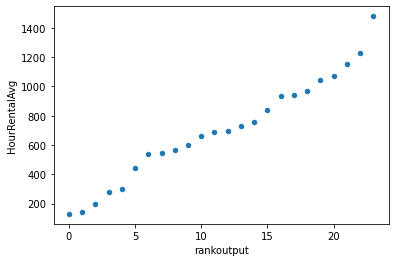

In [59]:
#    Get the mean for each hour in the training set
HourRentalAvg = [0]*24
for i in range (0,24):
    HourRentalAvg[i] = X_train[(X_train["Hour"]==i)]["Rented Bike Count"].mean()

#    Rank the mean of each hour in the training set
rankoutput = [0] * len(HourRentalAvg)
for i, x in enumerate(sorted(range(len(HourRentalAvg)), key=lambda y: HourRentalAvg[y])):
    rankoutput[x] = i
printif(ShowWork, rankoutput)

#    Create list containing matching Ranks for every hour
AvgHourRank = pdBikeData["Hour"].copy()
for i in range (0,len(pdBikeData)):
    AvgHourRank[i] = rankoutput[pdBikeData.iloc[i,5]]
printif(ShowWork, AvgHourRank) 

#    combine hourrental avg and rank into a dataframe
zipped = list(zip(HourRentalAvg, rankoutput))
AVGHOUR= pd.DataFrame(zipped, columns = ['HourRentalAvg', 'rankoutput'])
displayif (ShowWork,AVGHOUR)

print("Takeaway here is mostly linear relationship except for peak hour. \nCreate Two Hour Columns: one for rank, one for peak. \nThis may vary depending on the random state.")
displayif(ShowWork, AVGHOUR.plot(x=1, y= 0, kind='scatter'))

pdBikeData.insert(6, 'HourRank', AvgHourRank, allow_duplicates=False)
pdBikeData.insert(7, 'PeakHours', (pdBikeData[["HourRank"]] > 22) *1 , allow_duplicates=False)

In [60]:
display (pdBikeData.head(24))

,Date,Rented Bike Count,DayOfWeek,X0,DOWAdjust,Hour,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Spring,Summer,Autumn,Winter,Holiday,Functioning Day
0,1/12/2017,254,3,1,34.364,0,6,0,-5.2,37,2.2,2000,-17.6,0.00,0.0,0.0,Winter,0,0,0,1,0,1
1,1/12/2017,204,3,1,34.364,1,5,0,-5.5,38,0.8,2000,-17.6,0.00,0.0,0.0,Winter,0,0,0,1,0,1
2,1/12/2017,173,3,1,34.364,2,4,0,-6.0,39,1.0,2000,-17.7,0.00,0.0,0.0,Winter,0,0,0,1,0,1
3,1/12/2017,107,3,1,34.364,3,2,0,-6.2,40,0.9,2000,-17.6,0.00,0.0,0.0,Winter,0,0,0,1,0,1
4,1/12/2017,78,3,1,34.364,4,0,0,-6.0,36,2.3,2000,-18.6,0.00,0.0,0.0,Winter,0,0,0,1,0,1
5,1/12/2017,100,3,1,34.364,5,1,0,-6.4,37,1.5,2000,-18.7,0.00,0.0,0.0,Winter,0,0,0,1,0,1
6,1/12/2017,181,3,1,34.364,6,3,0,-6.6,35,1.3,2000,-19.5,0.00,0.0,0.0,Winter,0,0,0,1,0,1
7,1/12/2017,460,3,1,34.364,7,8,0,-7.4,38,0.9,2000,-19.3,0.00,0.0,0.0,Winter,0,0,0,1,0,1
8,1/12/2017,930,3,1,34.364,8,17,0,-7.6,37,1.1,2000,-19.8,0.01,0.0,0.0,Winter,0,0,0,1,0,1
9,1/12/2017,490,3,1,34.364,9,10,0,-6.5,27,0.5,1928,-22.4,0.23,0.0,0.0,Winter,0,0,0,1,0,1


### Check to see if there is linearity in Seasons for further consolidation
   <li>Possibly consolidate seasons
   <li>Check to see if spring summer autumn winter are different?

In [61]:
#    Get the hourly means for each season in the training set
SpringMean = X_train[X_train["Spring"] ==1]["Rented Bike Count"].mean()
SummerMean = X_train[X_train["Summer"] ==1]["Rented Bike Count"].mean()
AutumnMean = X_train[X_train["Autumn"] ==1]["Rented Bike Count"].mean()
WinterMean = X_train[X_train["Winter"] ==1]["Rented Bike Count"].mean()

printif(ShowWork,"SpringMean:" + str(SpringMean) +"\n SummerMean:" + str(SummerMean) +"\n AutumnMean:" + str(AutumnMean) + "\n WinterMean:" + str(WinterMean))

pdBikeData.insert(20, "SeasonalMeanAdj", (pdBikeData["Spring"]*SpringMean + pdBikeData["Summer"]*SummerMean + pdBikeData["Autumn"]*AutumnMean + pdBikeData["Winter"]*WinterMean)/SummerMean)

pdBikeData

SpringMean:721.3258785942492
 SummerMean:1035.8969539857421
 AutumnMean:826.1104613385315
 WinterMean:225.2107744107744


,Date,Rented Bike Count,DayOfWeek,X0,DOWAdjust,Hour,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Spring,Summer,Autumn,SeasonalMeanAdj,Winter,Holiday,Functioning Day
0,1/12/2017,254,3,1,34.364,0,6,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
1,1/12/2017,204,3,1,34.364,1,5,0,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
2,1/12/2017,173,3,1,34.364,2,4,0,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
3,1/12/2017,107,3,1,34.364,3,2,0,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
4,1/12/2017,78,3,1,34.364,4,0,0,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,4,1,55.413,19,22,0,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,0,0,1,0.797,0,0,1
8756,30/11/2018,764,4,1,55.413,20,20,0,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,0,0,1,0.797,0,0,1
8757,30/11/2018,694,4,1,55.413,21,19,0,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,0,0,1,0.797,0,0,1
8758,30/11/2018,712,4,1,55.413,22,16,0,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,0,0,1,0.797,0,0,1


In [62]:
X_train, X_test, y_train, y_test = train_test_split(pdBikeData.iloc[:,1:], pdBikeData['Rented Bike Count'], test_size = 0.3, random_state=42)

print("The training set median value of Rented Bikes: ", X_train['Rented Bike Count'].median())
pdBikeData.insert(2, 'MedianOrHigher', (pdBikeData[['Rented Bike Count']] >= X_train['Rented Bike Count'].median()) * 1, allow_duplicates=False)

#    Resplit the data know that the target variable has been added.
X_train, X_test, y_train, y_test = train_test_split(pdBikeData.iloc[:,3:], pdBikeData['MedianOrHigher'], test_size = 0.3, random_state=42)
print("After updating with the target variable and resplitting, this is what our Test data looks like:")
display(X_train)

The training set median value of Rented Bikes:  507.5
After updating with the target variable and resplitting, this is what our Test data looks like:


,DayOfWeek,X0,DOWAdjust,Hour,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Spring,Summer,Autumn,SeasonalMeanAdj,Winter,Holiday,Functioning Day
1444,1,1,-40.705,4,0,0,-11.1,50,1.2,1986,-19.4,0.00,0.0,0.0,Winter,0,0,0,0.217,1,0,1
1652,0,1,6.466,20,20,0,-5.8,44,2.1,1994,-16.1,0.00,0.0,0.0,Winter,0,0,0,0.217,1,0,1
7496,0,1,6.466,8,17,0,11.4,66,0.8,1991,5.2,0.18,0.0,0.0,Autumn,0,0,1,0.797,0,1,0
1893,5,1,30.784,21,19,0,-2.3,38,2.3,2000,-14.7,0.00,0.0,0.0,Winter,0,0,0,0.217,1,1,1
3880,0,1,6.466,16,18,0,19.1,54,3.2,542,9.5,0.94,0.0,0.0,Spring,1,0,0,0.696,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,4,1,55.413,22,16,0,29.9,74,2.0,1201,24.7,0.00,0.0,0.0,Summer,0,1,0,1.000,0,0,1
5191,0,1,6.466,7,8,0,23.5,90,0.5,445,21.7,0.05,0.5,0.0,Summer,0,1,0,1.000,0,0,1
5390,4,1,55.413,14,14,0,29.5,62,2.7,1941,21.4,1.79,0.0,0.0,Summer,0,1,0,1.000,0,0,1
860,1,1,-40.705,20,20,0,-3.4,51,1.1,1391,-12.1,0.00,0.0,0.0,Winter,0,0,0,0.217,1,0,1


In [63]:
BeforeDrop=pdBikeData.copy()
BeforeDrop


,Date,Rented Bike Count,MedianOrHigher,DayOfWeek,X0,DOWAdjust,Hour,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Spring,Summer,Autumn,SeasonalMeanAdj,Winter,Holiday,Functioning Day
0,1/12/2017,254,0,3,1,34.364,0,6,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
1,1/12/2017,204,0,3,1,34.364,1,5,0,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
2,1/12/2017,173,0,3,1,34.364,2,4,0,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
3,1/12/2017,107,0,3,1,34.364,3,2,0,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
4,1/12/2017,78,0,3,1,34.364,4,0,0,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,1,4,1,55.413,19,22,0,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,0,0,1,0.797,0,0,1
8756,30/11/2018,764,1,4,1,55.413,20,20,0,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,0,0,1,0.797,0,0,1
8757,30/11/2018,694,1,4,1,55.413,21,19,0,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,0,0,1,0.797,0,0,1
8758,30/11/2018,712,1,4,1,55.413,22,16,0,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,0,0,1,0.797,0,0,1


### I added these lines to reset the pdBikeData each time as I was experimenting with the Decision Tree section

In [64]:
#If you need to reset the pdBikeData
pdBikeData = BeforeDrop.copy()
pdBikeData.head()

,Date,Rented Bike Count,MedianOrHigher,DayOfWeek,X0,DOWAdjust,Hour,HourRank,PeakHours,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Spring,Summer,Autumn,SeasonalMeanAdj,Winter,Holiday,Functioning Day
0,1/12/2017,254,0,3,1,34.364,0,6,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
1,1/12/2017,204,0,3,1,34.364,1,5,0,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
2,1/12/2017,173,0,3,1,34.364,2,4,0,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
3,1/12/2017,107,0,3,1,34.364,3,2,0,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1
4,1/12/2017,78,0,3,1,34.364,4,0,0,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,0,0,0,0.217,1,0,1


### And this is where I deviate in appraoch from the first section.  
I realize that some work that was performed was not needed, but it was a fast and easy approach.  As a student, I have to weigh my options and this was one of those momemnts where it could have been cleaner, but it gets the job done.  

In [65]:
del pdBikeData['Date']
#del pdBikeData['DayOfWeek']
del pdBikeData['DOWAdjust']
#del pdBikeData['Hour']
#del pdBikeData['Spring']
#del pdBikeData['Summer']
#del pdBikeData['Autumn']
#del pdBikeData['Winter']
del pdBikeData['Seasons']
del pdBikeData['SeasonalMeanAdj']
del pdBikeData['X0']
del pdBikeData['PeakHours']
display(pdBikeData)
X_train, X_test, y_train, y_test = train_test_split(pdBikeData.iloc[:,2:], pdBikeData['MedianOrHigher'], test_size = 0.3, random_state=42)

display(X_train)

,Rented Bike Count,MedianOrHigher,DayOfWeek,Hour,HourRank,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Spring,Summer,Autumn,Winter,Holiday,Functioning Day
0,254,0,3,0,6,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
1,204,0,3,1,5,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
2,173,0,3,2,4,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,0,0,1,0,1
3,107,0,3,3,2,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,0,0,1,0,1
4,78,0,3,4,0,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1003,1,4,19,22,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,0,0,1,0,0,1
8756,764,1,4,20,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,0,0,1,0,0,1
8757,694,1,4,21,19,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,0,0,1,0,0,1
8758,712,1,4,22,16,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,0,0,1,0,0,1


,DayOfWeek,Hour,HourRank,Temperature(dC),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(dC),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Spring,Summer,Autumn,Winter,Holiday,Functioning Day
1444,1,4,0,-11.1,50,1.2,1986,-19.4,0.00,0.0,0.0,0,0,0,1,0,1
1652,0,20,20,-5.8,44,2.1,1994,-16.1,0.00,0.0,0.0,0,0,0,1,0,1
7496,0,8,17,11.4,66,0.8,1991,5.2,0.18,0.0,0.0,0,0,1,0,1,0
1893,5,21,19,-2.3,38,2.3,2000,-14.7,0.00,0.0,0.0,0,0,0,1,1,1
3880,0,16,18,19.1,54,3.2,542,9.5,0.94,0.0,0.0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,4,22,16,29.9,74,2.0,1201,24.7,0.00,0.0,0.0,0,1,0,0,0,1
5191,0,7,8,23.5,90,0.5,445,21.7,0.05,0.5,0.0,0,1,0,0,0,1
5390,4,14,14,29.5,62,2.7,1941,21.4,1.79,0.0,0.0,0,1,0,0,0,1
860,1,20,20,-3.4,51,1.1,1391,-12.1,0.00,0.0,0.0,0,0,0,1,0,1


# Decision Tree w/out paramaters, no CV

Train Score :  1.0       Test Score :  0.91324200913242


Text(0.5, 1.0, 'Feature Importance')

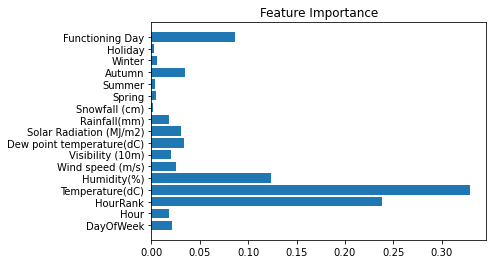

In [66]:

dtnoparams = DecisionTreeClassifier(random_state = 42)

dtnoparams.fit(X_train, y_train)

print( "Train Score : ",dtnoparams.score(X_train, y_train), "      Test Score : ", dtnoparams.score(X_test, y_test)) 
my_x = X_test.columns

my_y = dtnoparams.feature_importances_

plt.barh(my_x, my_y)
plt.title("Feature Importance")

Text(0.5, 1.0, 'DT no params Testing Set')

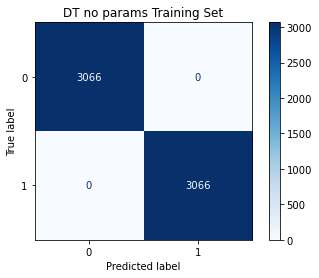

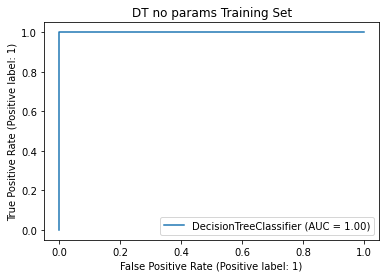

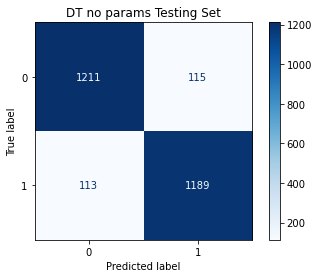

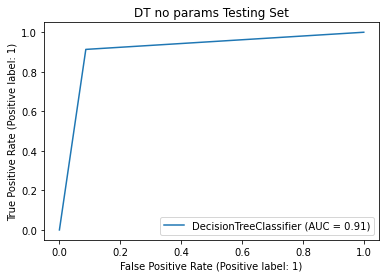

In [67]:
######## UPDATE THESE TWO LINES ###############
ToPlot = dtnoparams
TitleString = "DT no params"


#    Train Outcomes
disp = plot_confusion_matrix(ToPlot,  X_train, y_train, cmap='Blues', values_format='d')
disp.ax_.set_title(TitleString +" Training Set")
disp = plot_roc_curve(ToPlot, X_train, y_train)
disp.ax_.set_title(TitleString +" Training Set")

#    Test Outcomes
disp = plot_confusion_matrix(ToPlot,  X_test, y_test, cmap='Blues', values_format='d')
disp.ax_.set_title(TitleString +" Testing Set")
disp = plot_roc_curve(ToPlot, X_test, y_test)
disp.ax_.set_title(TitleString +" Testing Set")

In [68]:

y_test_predict_proba = dtnoparams.predict_proba(X_test)

y_pred = dtnoparams.predict(X_test)
print("Confusion Matrix Tree : \n", confusion_matrix(y_test, y_pred),"\n")
print("The precision for Tree is ",precision_score(y_test, y_pred)) 
print("The recall for Tree is ",recall_score(y_test, y_pred),"\n")  

cm = confusion_matrix(y_test, y_pred)
tn,fp,fn,tp = confusion_matrix(y_test, y_pred).ravel()

print("TEST DATA RESULTS : ", TitleString,"\n***************************************")
print("         Accuracy : ", accuracy_score(y_test,y_pred))
print("Balanced accuracy : ", balanced_accuracy_score(y_test,y_pred))
print("        Precision : ", precision_score(y_test,y_pred))
print("           Recall : ", recall_score(y_test,y_pred))
#print("              AUC : ", roc_auc_score(y_test,y_test_predict_proba))
print("      Sensitivity : ", (tp/(tp+fn)))
print("      Specificity : ", (tn/(tn+fp)))

Confusion Matrix Tree : 
 [[1211  115]
 [ 113 1189]] 

The precision for Tree is  0.9118098159509203
The recall for Tree is  0.9132104454685099 

TEST DATA RESULTS :  DT no params 
***************************************
         Accuracy :  0.91324200913242
Balanced accuracy :  0.9132417234884027
        Precision :  0.9118098159509203
           Recall :  0.9132104454685099
      Sensitivity :  0.9132104454685099
      Specificity :  0.9132730015082956


In [69]:
fig = plt.figure(figsize=(300,65)) # set a proper figure size (in case that the figure is too small to read or ratio is not proper)

tree.plot_tree(dtnoparams, 
               #feature_names = cancer.feature_names, # specify variable names 
               feature_names = X_test.columns, # specify variable names 
               #class_names = cancer.target_names, # specify class (Y) names
               class_names = ["< Median", "> Median"],# specify class (Y) names
               filled = True, impurity = False,#) # whether to color the boxes, whether to report gini index
               fontsize = 11.25) # set fontsize to read
plt.show()

# Decision tree, max depth = 3, no CV

Train Score :  0.883235485975212       Test Score :  0.886986301369863


Text(0.5, 1.0, 'Feature Importance')

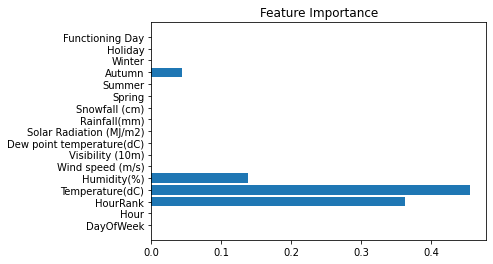

In [70]:
# Let maximum depth be 3

# A Basic Tree
dt_depth3 = DecisionTreeClassifier(random_state = 42, max_depth = 3)
dt_depth3.fit(X_train, y_train)

print( "Train Score : ",dt_depth3.score(X_train, y_train), "      Test Score : ", dt_depth3.score(X_test, y_test))

my_x = X_test.columns

my_y = dt_depth3.feature_importances_

plt.barh(my_x, my_y)
plt.title("Feature Importance")

Text(0.5, 1.0, 'DT Max_Depth=3, no CV Testing Set')

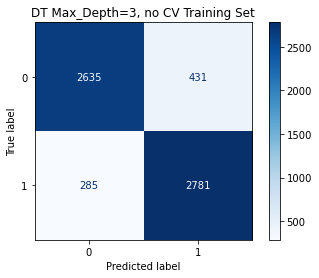

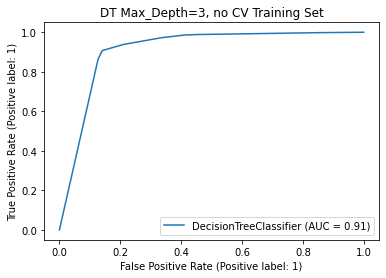

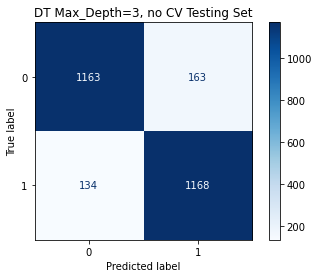

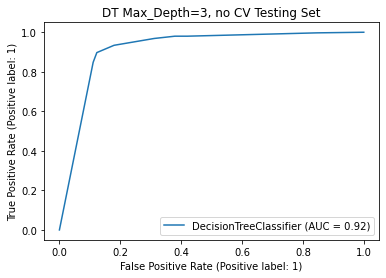

In [71]:
######## UPDATE THESE TWO LINES ###############
ToPlot = dt_depth3
TitleString = "DT Max_Depth=3, no CV"


#    Train Outcomes
disp = plot_confusion_matrix(ToPlot,  X_train, y_train, cmap='Blues', values_format='d')
disp.ax_.set_title(TitleString +" Training Set")
disp = plot_roc_curve(ToPlot, X_train, y_train)
disp.ax_.set_title(TitleString +" Training Set")

#    Test Outcomes
disp = plot_confusion_matrix(ToPlot,  X_test, y_test, cmap='Blues', values_format='d')
disp.ax_.set_title(TitleString +" Testing Set")
disp = plot_roc_curve(ToPlot, X_test, y_test)
disp.ax_.set_title(TitleString +" Testing Set")



# Decision tree, Hyperparameters: {depth, sampsplit, leaf, criterion}, CV =5

Best Params:  {'criterion': 'gini', 'max_depth': 5, 'max_leaf_nodes': 10, 'min_samples_split': 2}
Best Score:  0.9078590602153025
Test Score:  0.9117199391171994
Confusion Matrix Tree : 
 [[1236   90]
 [ 142 1160]] 

TEST DATA RESULTS :  DT Max_Depth=3, no CV 
***************************************
         Accuracy :  0.9117199391171994
Balanced accuracy :  0.9115318584009287
        Precision :  0.928
           Recall :  0.890937019969278
      Sensitivity :  0.890937019969278
      Specificity :  0.9321266968325792


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.010,7.956e-04,0.002,3.846e-04,gini,3,2,2,"{'criterion': 'gini', 'max_depth': 3, 'max_lea...",0.751,0.747,0.743,0.766,0.741,0.750,0.009,1153
1,0.010,4.128e-04,0.003,4.878e-04,gini,3,2,3,"{'criterion': 'gini', 'max_depth': 3, 'max_lea...",0.751,0.747,0.743,0.766,0.741,0.750,0.009,1153
2,0.009,4.883e-04,0.002,3.990e-04,gini,3,2,4,"{'criterion': 'gini', 'max_depth': 3, 'max_lea...",0.751,0.747,0.743,0.766,0.741,0.750,0.009,1153
3,0.009,5.744e-04,0.002,4.866e-04,gini,3,2,5,"{'criterion': 'gini', 'max_depth': 3, 'max_lea...",0.751,0.747,0.743,0.766,0.741,0.750,0.009,1153
4,0.009,6.298e-04,0.002,1.249e-06,gini,3,2,6,"{'criterion': 'gini', 'max_depth': 3, 'max_lea...",0.751,0.747,0.743,0.766,0.741,0.750,0.009,1153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1291,0.042,4.376e-03,0.003,5.287e-04,entropy,10,10,6,"{'criterion': 'entropy', 'max_depth': 10, 'max...",0.882,0.910,0.892,0.903,0.902,0.898,0.010,262
1292,0.033,1.123e-03,0.004,6.426e-04,entropy,10,10,7,"{'criterion': 'entropy', 'max_depth': 10, 'max...",0.882,0.910,0.892,0.903,0.902,0.898,0.010,262
1293,0.032,1.890e-03,0.004,1.603e-04,entropy,10,10,8,"{'criterion': 'entropy', 'max_depth': 10, 'max...",0.882,0.910,0.892,0.903,0.902,0.898,0.010,262
1294,0.033,1.080e-03,0.003,6.937e-04,entropy,10,10,9,"{'criterion': 'entropy', 'max_depth': 10, 'max...",0.882,0.910,0.892,0.903,0.902,0.898,0.010,262


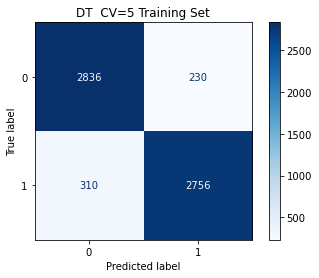

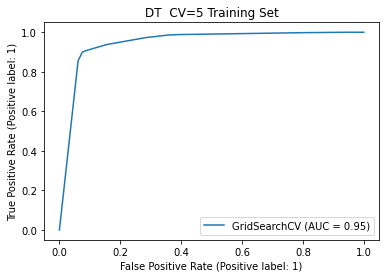

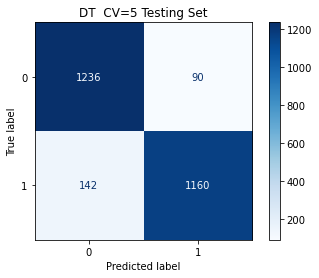

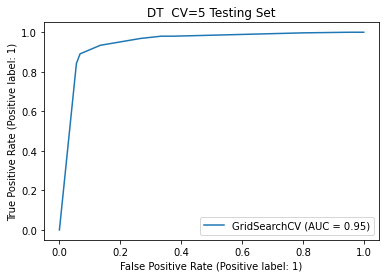

In [72]:


#    estimator
opt_tree = DecisionTreeClassifier(random_state = 42) 
##  random state is set for all models (hyperparameter specifications)

#    hyperparameter setting
dt_params = {'max_depth':  range(3,11) ,
             'min_samples_split':   range(2,11),
             'max_leaf_nodes':    range(2,11),
             'criterion': ["gini", "entropy"],
             #'ccp_alpha': [0,.01,.02,.03,.04]
            }


#    gridsearch function
grid_tree5 = GridSearchCV(opt_tree, dt_params, cv=5, n_jobs=-1)

grid_tree5.fit(X_train, y_train)

print("Best Params: " , grid_tree5.best_params_,)
print("Best Score: ", grid_tree5.best_score_)
print("Test Score: ", grid_tree5.score(X_test,y_test))
DTCV5 = pd.DataFrame(grid_tree5.cv_results_)

y_test_predict_proba = grid_tree5.predict_proba(X_test)

y_pred = grid_tree5.predict(X_test)
print("Confusion Matrix Tree : \n", confusion_matrix(y_test, y_pred),"\n")


cm = confusion_matrix(y_test, y_pred)
tn,fp,fn,tp = confusion_matrix(y_test, y_pred).ravel()

print("TEST DATA RESULTS : ", TitleString,"\n***************************************")
print("         Accuracy : ", accuracy_score(y_test,y_pred))
print("Balanced accuracy : ", balanced_accuracy_score(y_test,y_pred))
print("        Precision : ", precision_score(y_test,y_pred))
print("           Recall : ", recall_score(y_test,y_pred))
#print("              AUC : ", roc_auc_score(y_test,y_test_predict_proba))
print("      Sensitivity : ", (tp/(tp+fn)))
print("      Specificity : ", (tn/(tn+fp)))


######## UPDATE THESE TWO LINES ###############
ToPlot = grid_tree5
TitleString = "DT  CV=5"


#    Train Outcomes
disp = plot_confusion_matrix(ToPlot,  X_train, y_train, cmap='Blues', values_format='d')
disp.ax_.set_title(TitleString +" Training Set")
disp = plot_roc_curve(ToPlot, X_train, y_train)
disp.ax_.set_title(TitleString +" Training Set")

#    Test Outcomes
disp = plot_confusion_matrix(ToPlot,  X_test, y_test, cmap='Blues', values_format='d')
disp.ax_.set_title(TitleString +" Testing Set")
disp = plot_roc_curve(ToPlot, X_test, y_test)
disp.ax_.set_title(TitleString +" Testing Set")



DTCV5

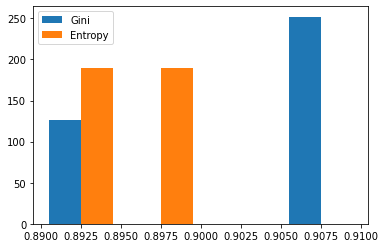

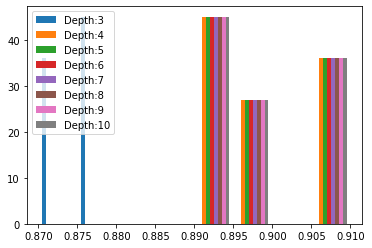

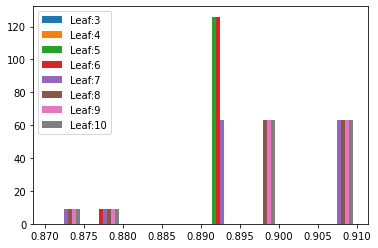

In [73]:
GiniSubset=DTCV5[DTCV5['param_criterion']=="gini"].mean_test_score
EntropySubset=DTCV5[DTCV5['param_criterion']=="entropy"].mean_test_score

DepthSubset3=DTCV5[DTCV5['param_max_depth']==3].mean_test_score
DepthSubset4=DTCV5[DTCV5['param_max_depth']==4].mean_test_score
DepthSubset5=DTCV5[DTCV5['param_max_depth']==5].mean_test_score
DepthSubset6=DTCV5[DTCV5['param_max_depth']==6].mean_test_score
DepthSubset7=DTCV5[DTCV5['param_max_depth']==7].mean_test_score
DepthSubset8=DTCV5[DTCV5['param_max_depth']==8].mean_test_score
DepthSubset9=DTCV5[DTCV5['param_max_depth']==9].mean_test_score
DepthSubset10=DTCV5[DTCV5['param_max_depth']==10].mean_test_score
 
LeafSubset3=DTCV5[DTCV5['param_max_leaf_nodes']==3].mean_test_score
LeafSubset4=DTCV5[DTCV5['param_max_leaf_nodes']==4].mean_test_score
LeafSubset5=DTCV5[DTCV5['param_max_leaf_nodes']==5].mean_test_score
LeafSubset6=DTCV5[DTCV5['param_max_leaf_nodes']==6].mean_test_score
LeafSubset7=DTCV5[DTCV5['param_max_leaf_nodes']==7].mean_test_score
LeafSubset8=DTCV5[DTCV5['param_max_leaf_nodes']==8].mean_test_score
LeafSubset9=DTCV5[DTCV5['param_max_leaf_nodes']==9].mean_test_score
LeafSubset10=DTCV5[DTCV5['param_max_leaf_nodes']==10].mean_test_score

plt.hist([GiniSubset, EntropySubset], bins = [.890,.895,.90,.905,.91],label=['Gini', 'Entropy'])

plt.legend(loc='upper left')
plt.show()



plt.hist([DepthSubset3, DepthSubset4,DepthSubset5, DepthSubset6,DepthSubset7, DepthSubset8,DepthSubset9, DepthSubset10], 
         bins = [.87,.875,.880,.885,.890,.895,.90,.905,.91],label=['Depth:3', 'Depth:4', 'Depth:5', 'Depth:6','Depth:7', 'Depth:8','Depth:9', 'Depth:10'])
plt.legend(loc='upper left')
plt.show()


plt.hist([LeafSubset3, LeafSubset4, LeafSubset5, LeafSubset6, LeafSubset7, LeafSubset8, LeafSubset9, LeafSubset10], 
         bins = [.87,.875,.880,.885,.890,.895,.90,.905,.91],label=['Leaf:3', 'Leaf:4', 'Leaf:5', 'Leaf:6','Leaf:7', 'Leaf:8','Leaf:9', 'Leaf:10'])
plt.legend(loc='upper left')
plt.show()

In [74]:
MaxScorePerDepth =  []
for depth in range (0,11): 
    print("Max Score at depth=" , depth, " is :", DTCV5.loc[DTCV5['param_max_depth']==depth,'mean_test_score'].max())
    MaxScorePerDepth.append(DTCV5.loc[DTCV5['param_max_depth']==depth,'mean_test_score'].max())
  
for depth in range (3,11): 
    Subset = DTCV5[DTCV5['param_max_depth']==depth]
    Subset2 = pd.DataFrame(Subset[Subset['mean_test_score']==MaxScorePerDepth[depth]])
    display(Subset2[['param_criterion','param_max_depth','param_max_leaf_nodes','param_min_samples_split','mean_test_score']])
    

Max Score at depth= 0  is : nan
Max Score at depth= 1  is : nan
Max Score at depth= 2  is : nan
Max Score at depth= 3  is : 0.8794841727259552
Max Score at depth= 4  is : 0.9072066646192054
Max Score at depth= 5  is : 0.9078590602153025
Max Score at depth= 6  is : 0.9078590602153025
Max Score at depth= 7  is : 0.9078590602153025
Max Score at depth= 8  is : 0.9078590602153025
Max Score at depth= 9  is : 0.9078590602153025
Max Score at depth= 10  is : 0.9078590602153025


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
36,gini,3,6,2,0.879
37,gini,3,6,3,0.879
38,gini,3,6,4,0.879
39,gini,3,6,5,0.879
40,gini,3,6,6,0.879
41,gini,3,6,7,0.879
42,gini,3,6,8,0.879
43,gini,3,6,9,0.879
44,gini,3,6,10,0.879


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
153,gini,4,10,2,0.907
154,gini,4,10,3,0.907
155,gini,4,10,4,0.907
156,gini,4,10,5,0.907
157,gini,4,10,6,0.907
158,gini,4,10,7,0.907
159,gini,4,10,8,0.907
160,gini,4,10,9,0.907
161,gini,4,10,10,0.907


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
234,gini,5,10,2,0.908
235,gini,5,10,3,0.908
236,gini,5,10,4,0.908
237,gini,5,10,5,0.908
238,gini,5,10,6,0.908
239,gini,5,10,7,0.908
240,gini,5,10,8,0.908
241,gini,5,10,9,0.908
242,gini,5,10,10,0.908


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
315,gini,6,10,2,0.908
316,gini,6,10,3,0.908
317,gini,6,10,4,0.908
318,gini,6,10,5,0.908
319,gini,6,10,6,0.908
320,gini,6,10,7,0.908
321,gini,6,10,8,0.908
322,gini,6,10,9,0.908
323,gini,6,10,10,0.908


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
396,gini,7,10,2,0.908
397,gini,7,10,3,0.908
398,gini,7,10,4,0.908
399,gini,7,10,5,0.908
400,gini,7,10,6,0.908
401,gini,7,10,7,0.908
402,gini,7,10,8,0.908
403,gini,7,10,9,0.908
404,gini,7,10,10,0.908


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
477,gini,8,10,2,0.908
478,gini,8,10,3,0.908
479,gini,8,10,4,0.908
480,gini,8,10,5,0.908
481,gini,8,10,6,0.908
482,gini,8,10,7,0.908
483,gini,8,10,8,0.908
484,gini,8,10,9,0.908
485,gini,8,10,10,0.908


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
558,gini,9,10,2,0.908
559,gini,9,10,3,0.908
560,gini,9,10,4,0.908
561,gini,9,10,5,0.908
562,gini,9,10,6,0.908
563,gini,9,10,7,0.908
564,gini,9,10,8,0.908
565,gini,9,10,9,0.908
566,gini,9,10,10,0.908


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
639,gini,10,10,2,0.908
640,gini,10,10,3,0.908
641,gini,10,10,4,0.908
642,gini,10,10,5,0.908
643,gini,10,10,6,0.908
644,gini,10,10,7,0.908
645,gini,10,10,8,0.908
646,gini,10,10,9,0.908
647,gini,10,10,10,0.908


In [75]:
print(tree.export_text(grid_tree5.best_estimator_))

|--- feature_3 <= 7.35
|   |--- feature_13 <= 0.50
|   |   |--- feature_2 <= 16.50
|   |   |   |--- class: 0
|   |   |--- feature_2 >  16.50
|   |   |   |--- class: 0
|   |--- feature_13 >  0.50
|   |   |--- feature_2 <= 5.50
|   |   |   |--- class: 0
|   |   |--- feature_2 >  5.50
|   |   |   |--- class: 1
|--- feature_3 >  7.35
|   |--- feature_2 <= 4.50
|   |   |--- feature_2 <= 2.50
|   |   |   |--- class: 0
|   |   |--- feature_2 >  2.50
|   |   |   |--- class: 0
|   |--- feature_2 >  4.50
|   |   |--- feature_4 <= 88.50
|   |   |   |--- feature_16 <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- feature_16 >  0.50
|   |   |   |   |--- feature_9 <= 0.05
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_9 >  0.05
|   |   |   |   |   |--- class: 0
|   |   |--- feature_4 >  88.50
|   |   |   |--- class: 0



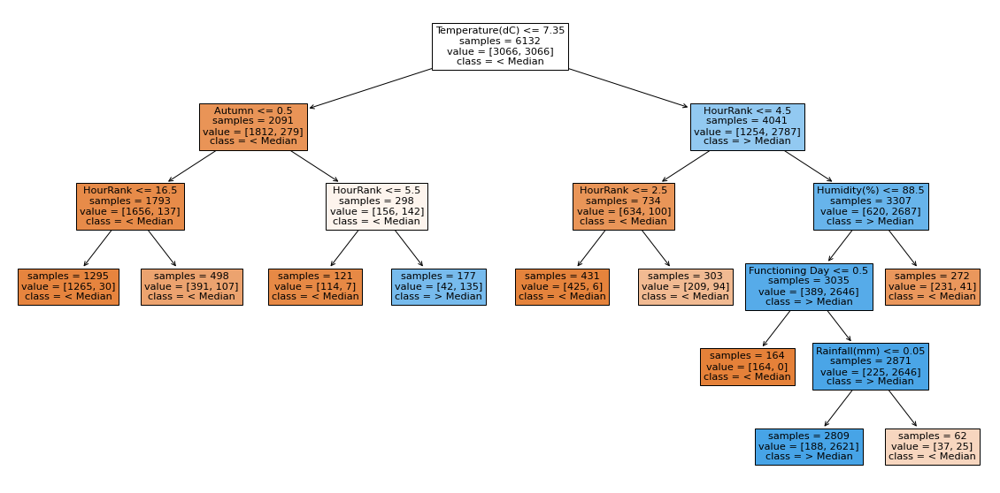

In [76]:
# Plot the decision tree
fig = plt.figure(figsize=(20,10)) # set a proper figure size (in case that the figure is too small to read or ratio is not proper)

tree.plot_tree(grid_tree5.best_estimator_, 
               #feature_names = cancer.feature_names, # specify variable names 
               feature_names = X_test.columns, # specify variable names 
               #class_names = cancer.target_names, # specify class (Y) names
               class_names = ["< Median", "> Median"],# specify class (Y) names
               filled = True, impurity = False,#) # whether to color the boxes, whether to report gini index
               fontsize = 11.25) # set fontsize to read
plt.show()

# Decision tree, Hyperparameters: {depth, sampsplit, leaf, criterion}, CV =10


Best Params:  {'ccp_alpha': 0, 'criterion': 'gini', 'max_depth': 9, 'max_leaf_nodes': 40, 'min_samples_split': 10}
Best Score:  0.9209077479794466
Test Score:  0.9204718417047184
Confusion Matrix Tree : 
 [[1244   82]
 [ 127 1175]] 

TEST DATA RESULTS :  DT  CV=5 
***************************************
         Accuracy :  0.9204718417047184
Balanced accuracy :  0.9203088183164084
        Precision :  0.9347653142402546
           Recall :  0.9024577572964669
      Sensitivity :  0.9024577572964669
      Specificity :  0.9381598793363499


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_ccp_alpha,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.017,0.002,2.291e-03,6.279e-04,0,gini,8,10,10,"{'ccp_alpha': 0, 'criterion': 'gini', 'max_dep...",0.896,0.897,0.922,0.930,0.902,0.907,0.918,0.891,0.915,0.927,0.910,0.013,186
1,0.014,0.002,5.881e-04,6.414e-04,0,gini,8,10,20,"{'ccp_alpha': 0, 'criterion': 'gini', 'max_dep...",0.896,0.897,0.922,0.930,0.902,0.907,0.918,0.891,0.915,0.927,0.910,0.013,186
2,0.012,0.005,0.000e+00,0.000e+00,0,gini,8,10,40,"{'ccp_alpha': 0, 'criterion': 'gini', 'max_dep...",0.896,0.897,0.922,0.930,0.902,0.907,0.918,0.891,0.915,0.927,0.910,0.013,186
3,0.018,0.002,0.000e+00,0.000e+00,0,gini,8,10,50,"{'ccp_alpha': 0, 'criterion': 'gini', 'max_dep...",0.896,0.897,0.922,0.930,0.902,0.907,0.918,0.891,0.915,0.927,0.910,0.013,186
4,0.015,0.004,1.238e-03,3.283e-03,0,gini,8,10,60,"{'ccp_alpha': 0, 'criterion': 'gini', 'max_dep...",0.896,0.897,0.922,0.930,0.902,0.907,0.918,0.891,0.915,0.927,0.910,0.013,186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0.050,0.010,2.762e-03,1.904e-03,0.02,entropy,10,100,40,"{'ccp_alpha': 0.02, 'criterion': 'entropy', 'm...",0.878,0.888,0.902,0.904,0.896,0.884,0.915,0.871,0.881,0.910,0.893,0.014,1030
1466,0.045,0.010,1.503e-03,1.289e-03,0.02,entropy,10,100,50,"{'ccp_alpha': 0.02, 'criterion': 'entropy', 'm...",0.878,0.888,0.902,0.904,0.896,0.884,0.915,0.871,0.881,0.910,0.893,0.014,1030
1467,0.044,0.010,1.297e-03,1.184e-03,0.02,entropy,10,100,60,"{'ccp_alpha': 0.02, 'criterion': 'entropy', 'm...",0.878,0.888,0.902,0.904,0.896,0.884,0.915,0.871,0.881,0.910,0.893,0.014,1030
1468,0.045,0.003,3.532e-03,2.241e-03,0.02,entropy,10,100,75,"{'ccp_alpha': 0.02, 'criterion': 'entropy', 'm...",0.878,0.888,0.902,0.904,0.896,0.884,0.915,0.871,0.881,0.910,0.893,0.014,1030


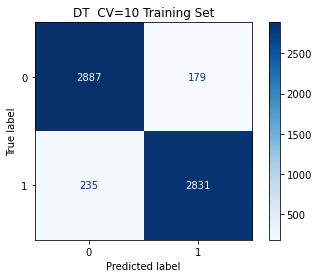

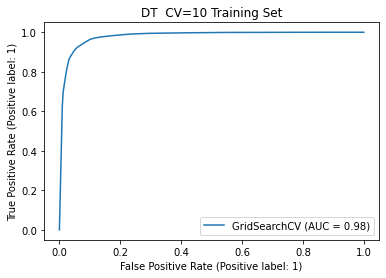

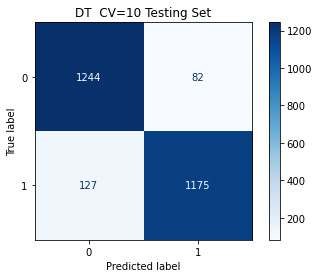

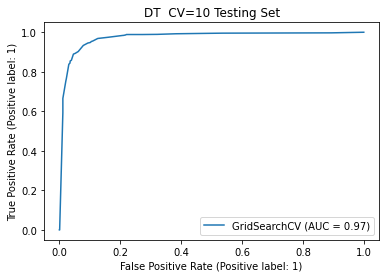

In [77]:
#    hyperparameter setting
dt_params = {'max_depth':  range(8,11) ,
             'min_samples_split':   [10,20,40, 50,60,75,100],
             'max_leaf_nodes':    [10,20,40, 50,60,75,100],
             'criterion': ["gini", "entropy"],
             'ccp_alpha': [0,.005,.01,.015,.02]
            }


#    gridsearch function
grid_tree10 = GridSearchCV(opt_tree, dt_params, cv=10, n_jobs=-1)

grid_tree10.fit(X_train, y_train)

print("Best Params: " , grid_tree10.best_params_,)
print("Best Score: ", grid_tree10.best_score_)
print("Test Score: ", grid_tree10.score(X_test,y_test))
DTCV10 = pd.DataFrame(grid_tree10.cv_results_)

y_test_predict_proba = grid_tree10.predict_proba(X_test)

y_pred = grid_tree10.predict(X_test)
print("Confusion Matrix Tree : \n", confusion_matrix(y_test, y_pred),"\n")


cm = confusion_matrix(y_test, y_pred)
tn,fp,fn,tp = confusion_matrix(y_test, y_pred).ravel()

print("TEST DATA RESULTS : ", TitleString,"\n***************************************")
print("         Accuracy : ", accuracy_score(y_test,y_pred))
print("Balanced accuracy : ", balanced_accuracy_score(y_test,y_pred))
print("        Precision : ", precision_score(y_test,y_pred))
print("           Recall : ", recall_score(y_test,y_pred))
#print("              AUC : ", roc_auc_score(y_test,y_test_predict_proba))
print("      Sensitivity : ", (tp/(tp+fn)))
print("      Specificity : ", (tn/(tn+fp)))


######## UPDATE THESE TWO LINES ###############
ToPlot = grid_tree10
TitleString = "DT  CV=10"


#    Train Outcomes
disp = plot_confusion_matrix(ToPlot,  X_train, y_train, cmap='Blues', values_format='d')
disp.ax_.set_title(TitleString +" Training Set")
disp = plot_roc_curve(ToPlot, X_train, y_train)
disp.ax_.set_title(TitleString +" Training Set")

#    Test Outcomes
disp = plot_confusion_matrix(ToPlot,  X_test, y_test, cmap='Blues', values_format='d')
disp.ax_.set_title(TitleString +" Testing Set")
disp = plot_roc_curve(ToPlot, X_test, y_test)
disp.ax_.set_title(TitleString +" Testing Set")

DTCV10

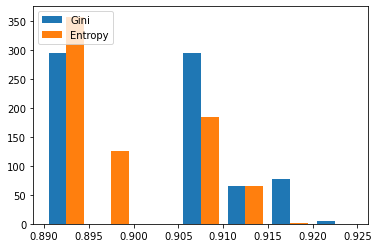

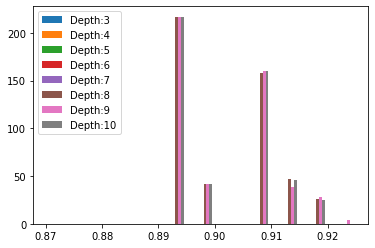

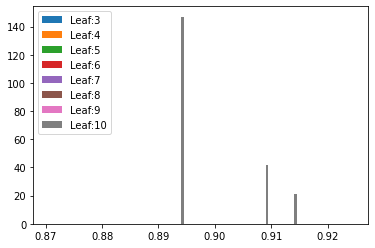

In [78]:
GiniSubset=DTCV10[DTCV10['param_criterion']=="gini"].mean_test_score
EntropySubset=DTCV10[DTCV10['param_criterion']=="entropy"].mean_test_score

DepthSubset3=DTCV10[DTCV10['param_max_depth']==3].mean_test_score
DepthSubset4=DTCV10[DTCV10['param_max_depth']==4].mean_test_score
DepthSubset5=DTCV10[DTCV10['param_max_depth']==5].mean_test_score
DepthSubset6=DTCV10[DTCV10['param_max_depth']==6].mean_test_score
DepthSubset7=DTCV10[DTCV10['param_max_depth']==7].mean_test_score
DepthSubset8=DTCV10[DTCV10['param_max_depth']==8].mean_test_score
DepthSubset9=DTCV10[DTCV10['param_max_depth']==9].mean_test_score
DepthSubset10=DTCV10[DTCV10['param_max_depth']==10].mean_test_score
 
LeafSubset3=DTCV10[DTCV10['param_max_leaf_nodes']==3].mean_test_score
LeafSubset4=DTCV10[DTCV10['param_max_leaf_nodes']==4].mean_test_score
LeafSubset5=DTCV10[DTCV10['param_max_leaf_nodes']==5].mean_test_score
LeafSubset6=DTCV10[DTCV10['param_max_leaf_nodes']==6].mean_test_score
LeafSubset7=DTCV10[DTCV10['param_max_leaf_nodes']==7].mean_test_score
LeafSubset8=DTCV10[DTCV10['param_max_leaf_nodes']==8].mean_test_score
LeafSubset9=DTCV10[DTCV10['param_max_leaf_nodes']==9].mean_test_score
LeafSubset10=DTCV10[DTCV10['param_max_leaf_nodes']==10].mean_test_score

plt.hist([GiniSubset, EntropySubset], bins = [.890,.895,.90,.905,.91,.915,.92,.925],label=['Gini', 'Entropy'])

plt.legend(loc='upper left')
plt.show()



plt.hist([DepthSubset3, DepthSubset4,DepthSubset5, DepthSubset6,DepthSubset7, DepthSubset8,DepthSubset9, DepthSubset10], 
         bins = [.87,.875,.880,.885,.890,.895,.90,.905,.91,.915,.92,.925],label=['Depth:3', 'Depth:4', 'Depth:5', 'Depth:6','Depth:7', 'Depth:8','Depth:9', 'Depth:10'])
plt.legend(loc='upper left')
plt.show()


plt.hist([LeafSubset3, LeafSubset4, LeafSubset5, LeafSubset6, LeafSubset7, LeafSubset8, LeafSubset9, LeafSubset10], 
         bins = [.87,.875,.880,.885,.890,.895,.90,.905,.91,.915,.92,.925],label=['Leaf:3', 'Leaf:4', 'Leaf:5', 'Leaf:6','Leaf:7', 'Leaf:8','Leaf:9', 'Leaf:10'])
plt.legend(loc='upper left')
plt.show()

In [79]:
MaxScorePerDepth =  []
for depth in range (0,11): 
    print("Max Score at depth=" , depth, " is :", DTCV10.loc[DTCV10['param_max_depth']==depth,'mean_test_score'].max())
    MaxScorePerDepth.append(DTCV10.loc[DTCV10['param_max_depth']==depth,'mean_test_score'].max())
  
for depth in range (3,11): 
    Subset = DTCV10[DTCV10['param_max_depth']==depth]
    Subset2 = pd.DataFrame(Subset[Subset['mean_test_score']==MaxScorePerDepth[depth]])
    display(Subset2[['param_criterion','param_max_depth','param_max_leaf_nodes','param_min_samples_split','mean_test_score']])
    

Max Score at depth= 0  is : nan
Max Score at depth= 1  is : nan
Max Score at depth= 2  is : nan
Max Score at depth= 3  is : nan
Max Score at depth= 4  is : nan
Max Score at depth= 5  is : nan
Max Score at depth= 6  is : nan
Max Score at depth= 7  is : nan
Max Score at depth= 8  is : 0.9191151542847427
Max Score at depth= 9  is : 0.9209077479794466
Max Score at depth= 10  is : 0.9196045506958356


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
29,gini,8,60,20,0.919


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
63,gini,9,40,10,0.921


,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_split,mean_test_score
113,gini,10,40,20,0.92


In [80]:
print(tree.export_text(grid_tree10.best_estimator_))

|--- feature_3 <= 7.35
|   |--- feature_13 <= 0.50
|   |   |--- feature_2 <= 16.50
|   |   |   |--- feature_14 <= 0.50
|   |   |   |   |--- feature_2 <= 7.50
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_2 >  7.50
|   |   |   |   |   |--- feature_0 <= 0.50
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_0 >  0.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |--- feature_14 >  0.50
|   |   |   |   |--- class: 0
|   |   |--- feature_2 >  16.50
|   |   |   |--- feature_14 <= 0.50
|   |   |   |   |--- feature_3 <= 3.05
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_3 >  3.05
|   |   |   |   |   |--- feature_7 <= -0.05
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_7 >  -0.05
|   |   |   |   |   |   |--- class: 0
|   |   |   |--- feature_14 >  0.50
|   |   |   |   |--- feature_1 <= 18.50
|   |   |   |   |   |--- feature_8 <= 0.01
|   |   |   |   |   |   |--- feature_4 <= 71.50
|   |   |   |   |   |   |   |-

In [81]:
grid_tree10.best_estimator_

DecisionTreeClassifier(ccp_alpha=0, max_depth=9, max_leaf_nodes=40,
                       min_samples_split=10, random_state=42)

In [82]:
#    Let maximum depth be 3

#    A Basic Tree
dt_Optimaldepth3 = DecisionTreeClassifier(random_state = 42, max_depth = 3,
             min_samples_split= 2,
             max_leaf_nodes= 6,
             criterion= "gini")
dt_Optimaldepth3.fit(X_train, y_train)

print( "Train Score : ",dt_Optimaldepth3.score(X_train, y_train), "      Test Score : ", dt_Optimaldepth3.score(X_test, y_test)) 

Train Score :  0.883235485975212       Test Score :  0.886986301369863


In [83]:
#    Let maximum depth be 4

#    A Basic Tree
dt_Optimaldepth4 = DecisionTreeClassifier(random_state = 42, max_depth = 4,
             min_samples_split= 2,
             max_leaf_nodes= 10,
             criterion= "gini")
dt_Optimaldepth4.fit(X_train, y_train)

print( "Train Score : ",dt_Optimaldepth4.score(X_train, y_train), "      Test Score : ", dt_Optimaldepth4.score(X_test, y_test)) 

Train Score :  0.91324200913242       Test Score :  0.9121004566210046


In [84]:
#    Let maximum depth be 5

#    A Basic Tree
dt_Optimaldepth5 = DecisionTreeClassifier(random_state = 42, max_depth = 5,
             min_samples_split= 2,
             max_leaf_nodes= 10,
             criterion= "gini")
dt_Optimaldepth5.fit(X_train, y_train)

print( "Train Score : ",dt_Optimaldepth5.score(X_train, y_train), "      Test Score : ", dt_Optimaldepth5.score(X_test, y_test)) 

Train Score :  0.9119373776908023       Test Score :  0.9117199391171994


# ALPHA ONLY PRUNING APPROACH

# Build a Preliminary Classification Tree

Train Score :  1.0       Test Score :  0.91324200913242


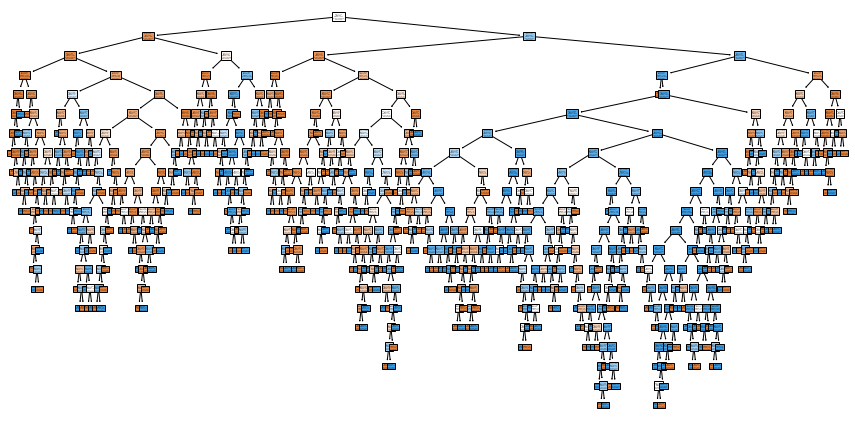

In [85]:
#    create a decision tree without any parameters and fit to training data
clf_dt = DecisionTreeClassifier(random_state=42)
BasicTree = clf_dt.fit(X_train, y_train)

#    Results for Train and Test
print( "Train Score : ",BasicTree.score(X_train, y_train), "      Test Score : ", BasicTree.score(X_test, y_test)) 

#    Plot Tree
plt.figure(figsize=(15,7.5))
plot_tree(BasicTree, filled = True,  class_names = ["Under", "Over"])
plt.show()

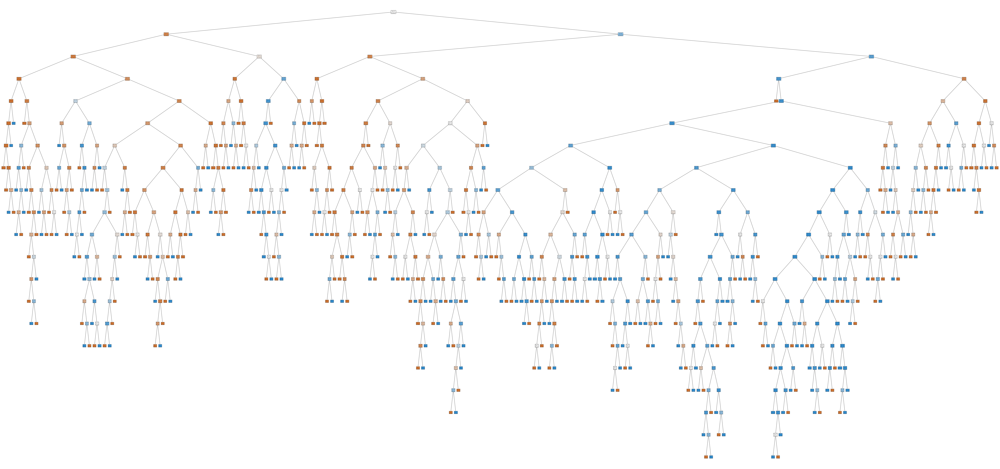

In [86]:
#   Plot Tree
plt.figure(figsize=(135,65))
plot_tree(BasicTree, filled = True,  class_names = ["Under", "Over"])
plt.show()

Text(0.5, 1.0, 'Testing Set- Full Tree No Parameters')

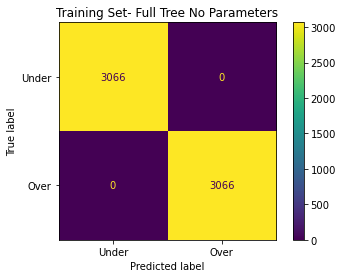

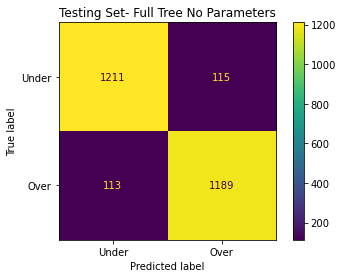

In [87]:
#    Results

plot_confusion_matrix(BasicTree, X_train, y_train, display_labels=["Under","Over"])
pl.title("Training Set- Full Tree No Parameters")
plot_confusion_matrix(BasicTree, X_test, y_test, display_labels=["Under","Over"])
pl.title("Testing Set- Full Tree No Parameters")

Text(0.5, 1.0, 'Feature Importance - Basic Tree')

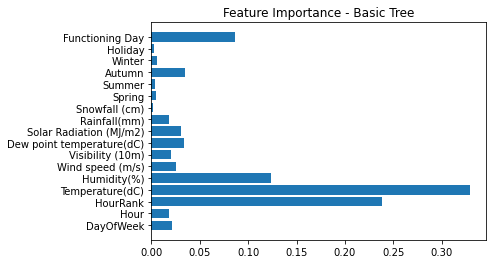

In [88]:
my_x = X_train.columns
my_y = BasicTree.feature_importances_

plt.barh(my_x, my_y)
plt.title("Feature Importance - Basic Tree")

## Cost Complexity on Preliminary Tree

In [89]:
#    Determine and capture the alpha values for our tree
path = BasicTree.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas #extract different values for alpha
ccp_alphas = ccp_alphas[:-1] #exclude the 1 node tree

#    Create an Array to store trees with different alpha settings
BasicTreesArray = []

#    Create one decision tree per alpha and store in our array
for ccp_alpha in ccp_alphas:
    AlphaTree = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha)
    AlphaTree.fit(X_train, y_train)
    BasicTreesArray.append(AlphaTree)

### Now graph accuracy of the trees created with the alphas

<function matplotlib.pyplot.show(close=None, block=None)>

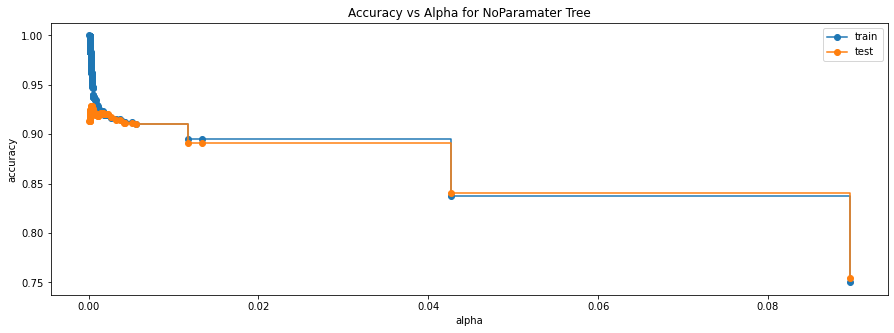

In [90]:
train_scores = [tree.score(X_train,y_train) for tree in BasicTreesArray]
test_scores= [tree.score(X_test,y_test) for tree in BasicTreesArray]


fig,ax = plt.subplots(figsize=(15,5))
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs Alpha for NoParamater Tree")
ax.plot(ccp_alphas, train_scores,marker = 'o', label = "train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores,marker = 'o', label = "test", drawstyle="steps-post")
ax.legend()
plt.show


In [91]:
ccp_alphas

array([0.        , 0.00010399, 0.00010663, 0.00010674, 0.00010727,
       0.00010765, 0.00010836, 0.00010861, 0.00010864, 0.00012231,
       0.0001359 , 0.0001359 , 0.0001359 , 0.00014269, 0.00014269,
       0.00014269, 0.00014269, 0.00014269, 0.00014496, 0.00014591,
       0.00014825, 0.00014825, 0.00015053, 0.00015221, 0.00015221,
       0.00015289, 0.00015289, 0.00015349, 0.00015402, 0.00015414,
       0.0001545 , 0.0001545 , 0.00015656, 0.00015656, 0.00015656,
       0.00015704, 0.00015867, 0.00015884, 0.0001589 , 0.00015933,
       0.00016061, 0.00016108, 0.00016145, 0.00016172, 0.00016308,
       0.00016308, 0.00016308, 0.00016776, 0.0001812 , 0.00018638,
       0.00018638, 0.00019244, 0.00019414, 0.00019511, 0.00019513,
       0.00019569, 0.00019569, 0.00019569, 0.00020118, 0.0002045 ,
       0.00021567, 0.00021744, 0.00021744, 0.00021744, 0.00021744,
       0.00021744, 0.00021744, 0.00021744, 0.00021744, 0.00021744,
       0.00021744, 0.00021744, 0.00021744, 0.00022197, 0.00022

In [92]:
target = max(test_scores)
print("MAX Test Score", target)

search=True
alphaloc = -1

while search:
    alphaloc = alphaloc + 1
    if test_scores[alphaloc] == target :
        search = False


print("Found at Tree Number:", alphaloc)
    
#    Confirm Tree number matches score
BestTestTree = BasicTreesArray[alphaloc]
BestFit = BestTestTree.fit(X_train, y_train)
BestFit.score(X_test,y_test)

#    Show best performing alpha
print("Our best performing Tree with alpha: ")
print(BasicTreesArray[alphaloc])
BestAlpha =ccp_alphas[alphaloc]


MAX Test Score 0.9288432267884322
Found at Tree Number: 134
Our best performing Tree with alpha: 
DecisionTreeClassifier(ccp_alpha=0.0003397477712546205, random_state=42)


### Now show that different training sets may produce another optimal value

<AxesSubplot:xlabel='tree'>

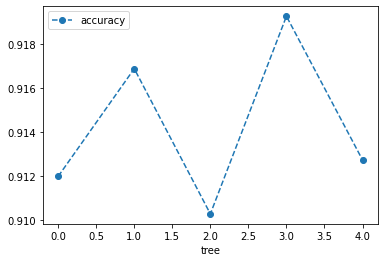

In [93]:

ExampleTree = BasicTreesArray[136]
ExampleScores = cross_val_score(ExampleTree, X_train, y_train, cv=5)
df = pd.DataFrame(data={'tree': range(5), 'accuracy':ExampleScores})

df.plot(x='tree', y='accuracy', marker='o', linestyle='--')

# Cross Validation For Finding the Best Alpha

<AxesSubplot:xlabel='alpha'>

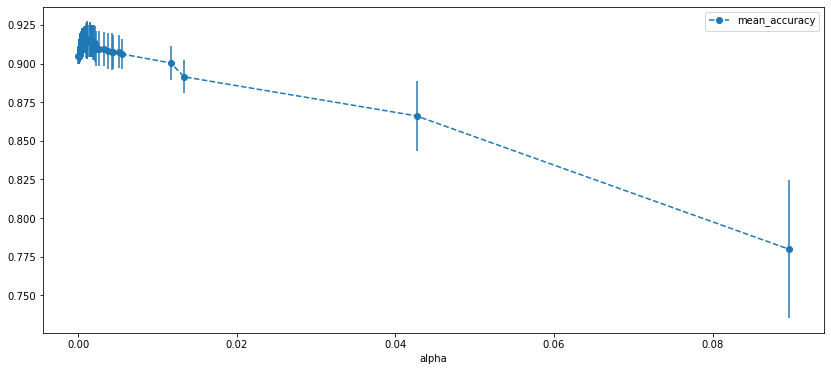

In [94]:
#    Create an array to stor the results of each fold during cross validation
AlphaLoopValues = []

#    For our previously defined alphas, run 5 fold cross validation 
for ccp_alpha in ccp_alphas:
    tree = DecisionTreeClassifier(random_state = 42, ccp_alpha =ccp_alpha)
    CVScores = cross_val_score(tree, X_train, y_train, cv=5)
    AlphaLoopValues.append([ccp_alpha, np.mean(CVScores), np.std(CVScores)])
    
#    Draw a graph of means and Standard Deviation of the scores
CValpha_results = pd.DataFrame(AlphaLoopValues[:], 
                             columns = ['alpha', 'mean_accuracy', 'StdDev'])
CValpha_results.plot(x='alpha', y = 'mean_accuracy', yerr='StdDev', marker = 'o', 
                   linestyle='--',figsize=(14,6))


<AxesSubplot:xlabel='alpha'>

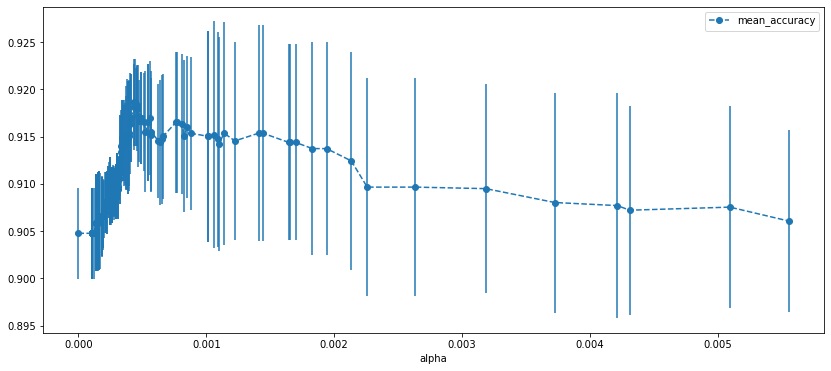

In [95]:
#    Draw a graph of means and Standard Deviation of the scores
alpha_results = pd.DataFrame(AlphaLoopValues[:-4], 
                             columns = ['alpha', 'mean_accuracy', 'StdDev'])
alpha_results.plot(x='alpha', y = 'mean_accuracy', yerr='StdDev', marker = 'o', 
                   linestyle='--',figsize=(14,6))


<AxesSubplot:xlabel='alpha'>

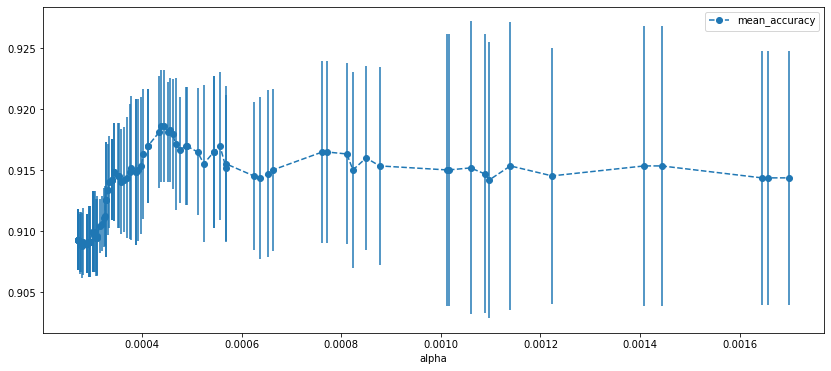

In [96]:
#    Zoom in 
#    Draw a graph of means and Standard Deviation of the scores
alpha_results = pd.DataFrame(AlphaLoopValues[100:192], 
                             columns = ['alpha', 'mean_accuracy', 'StdDev'])
alpha_results.plot(x='alpha', y = 'mean_accuracy', yerr='StdDev', marker = 'o', 
                   linestyle='--', figsize=(14,6))

In [97]:
alpha_results

,alpha,mean_accuracy,StdDev
0,2.718e-04,0.909,0.003
1,2.718e-04,0.909,0.003
2,2.718e-04,0.909,0.003
3,2.718e-04,0.909,0.003
4,2.718e-04,0.909,0.003
...,...,...,...
87,1.408e-03,0.915,0.011
88,1.443e-03,0.915,0.011
89,1.645e-03,0.914,0.010
90,1.657e-03,0.914,0.010


In [98]:
target = max(alpha_results.mean_accuracy)
print("Search target: ", target)

       
search=True
alphaloc = -1

while search:
    alphaloc = alphaloc + 1
    if alpha_results.loc[alphaloc,'mean_accuracy'] == target :
        search = False


print("Found at Tree Number:", alphaloc)
    

#    ConfirmTreenumber matches score
BestCVTestTree = DecisionTreeClassifier(random_state = 42, 
                                        ccp_alpha = alpha_results.loc[alphaloc,'alpha'] )
print ("BestCVScore:" , cross_val_score(BestCVTestTree,X_train,y_train,cv=5).mean())

#    Show best performing alpha
print("Our best performing Tree with alpha: ")
print(BestCVTestTree)


Search target:  0.9186239199309713
Found at Tree Number: 54
BestCVScore: 0.9186239199309713
Our best performing Tree with alpha: 
DecisionTreeClassifier(ccp_alpha=0.00043752609548920274, random_state=42)


In [99]:
Tree = DecisionTreeClassifier(random_state = 42, 
                                        ccp_alpha = 0.00043752609548920274 )
PrunedTree = Tree.fit(X_train, y_train)

#    Results for Train and Test
print( "Train Score : ",PrunedTree.score(X_train, y_train), "      Test Score : ", PrunedTree.score(X_test, y_test)) 



Train Score :  0.9518917155903457       Test Score :  0.9250380517503806


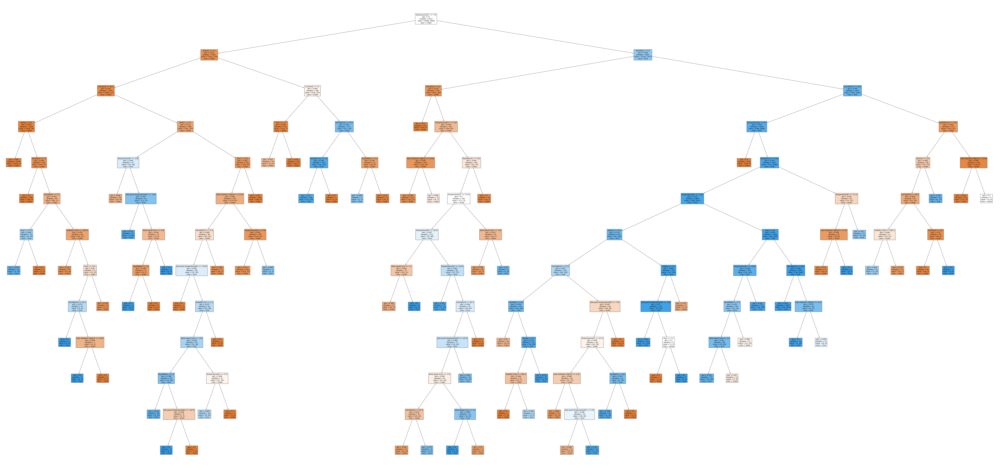

In [100]:
#    Plot Tree
plt.figure(figsize=(135,65))

plot_tree(PrunedTree, filled = True,  class_names = ["Under", "Over"], 
          feature_names=pdBikeData.iloc[:,2:].columns, fontsize=12)
plt.show()

PrunedTree

Text(0.5, 1.0, 'Testing Set- Pruned Tree CV5')

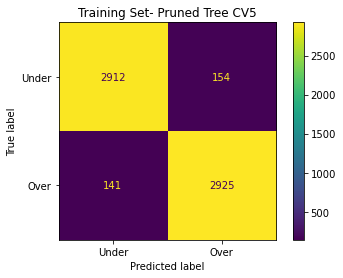

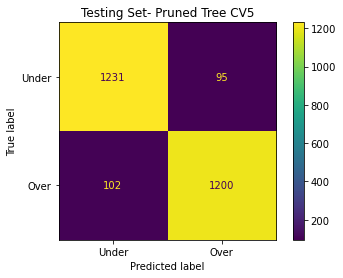

In [101]:
#Results
plot_confusion_matrix(PrunedTree, X_train, y_train, display_labels=["Under","Over"])
pl.title("Training Set- Pruned Tree CV5")
plot_confusion_matrix(PrunedTree, X_test, y_test, display_labels=["Under","Over"])
pl.title("Testing Set- Pruned Tree CV5")

Text(0.5, 1.0, 'Feature Importance - Pruned Tree')

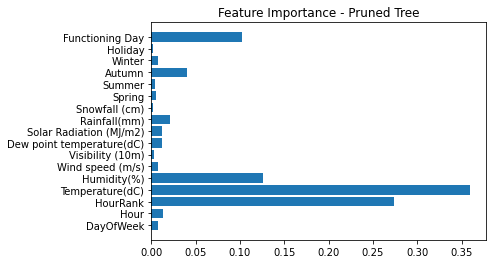

In [102]:
my_x = X_train.columns
my_y = PrunedTree.feature_importances_

plt.barh(my_x, my_y)
plt.title("Feature Importance - Pruned Tree")